## Comprime audios para el estudio de análisis de sentimientos

In [12]:
import os
import librosa
import soundfile as sf
import numpy as np

# ========== CONFIGURACIÓN ==========
DATASET_PATH = "Dataset_T"
OUTPUT_PATH = "Dataset_comprimido"
SAMPLE_RATE = 16000
THRESHOLD_DB = -25    # Nivel donde empieza a comprimirse
RATIO = 3.0           # Ratio de compresión
MAKEUP_GAIN = 5.0     # Ganancia final para compensar

# ========== FUNCIONES ==========
def db_to_amp(db):
    return 10 ** (db / 20.0)

def compress_dynamic(y, sr, threshold_db, ratio, makeup_gain_db):
    frame_length = 2048
    hop_length = 512
    rms = librosa.feature.rms(y=y, frame_length=frame_length, hop_length=hop_length)[0]
    rms_db = librosa.amplitude_to_db(rms, ref=1.0)

    gain_db = np.zeros_like(rms_db)
    for i, db_val in enumerate(rms_db):
        if db_val > threshold_db:
            gain_db[i] = (threshold_db + (db_val - threshold_db) / ratio) - db_val
        else:
            gain_db[i] = 0.0

    gain_db += makeup_gain_db
    gain = db_to_amp(gain_db)

    y_compressed = np.zeros_like(y)
    for i, g in enumerate(gain):
        start = i * hop_length
        end = min(start + frame_length, len(y))
        y_compressed[start:end] += y[start:end] * g

    # Evitar clipping
    max_amp = np.max(np.abs(y_compressed))
    if max_amp > 1.0:
        y_compressed = y_compressed / max_amp

    return y_compressed

# ========== PROCESAR ==========
os.makedirs(OUTPUT_PATH, exist_ok=True)

for emotion_folder in os.listdir(DATASET_PATH):
    input_emotion_path = os.path.join(DATASET_PATH, emotion_folder)
    output_emotion_path = os.path.join(OUTPUT_PATH, emotion_folder)
    os.makedirs(output_emotion_path, exist_ok=True)

    if not os.path.isdir(input_emotion_path):
        continue

    for fname in os.listdir(input_emotion_path):
        if fname.lower().endswith(".wav"):
            path = os.path.join(input_emotion_path, fname)
            y, sr = librosa.load(path, sr=SAMPLE_RATE)
            y_comp = compress_dynamic(y, sr, THRESHOLD_DB, RATIO, MAKEUP_GAIN)
            output_path = os.path.join(output_emotion_path, fname)
            sf.write(output_path, y_comp, sr)

print("Compresión dinámica aplicada a todos los audios.")


C:\Users\curso\AppData\Local\Temp\ipykernel_26080\1803144615.py:61: UserWarning: PySoundFile failed. Trying audioread instead.
  y, sr = librosa.load(path, sr=SAMPLE_RATE)
C:\Users\curso\anaconda3\Lib\site-packages\librosa\core\audio.py:184: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)


✅ Compresión dinámica aplicada a todos los audios.


## Analiza audios y genera el modelo de emociones 

  - Estadísticas para Alegria:
  - Archivos originales: 779
  - Archivos válidos (duración correcta): 246
Porcentaje válidos: 31.6%
  - Necesarios 4 archivos adicionales por data augmentation
  - Estadísticas para Enojo:
  - Archivos originales: 772
  - Archivos válidos (duración correcta): 406
Porcentaje válidos: 52.6%
No se necesitó data augmentation
  - Estadísticas para Miedo:
  - Archivos originales: 766
  - Archivos válidos (duración correcta): 367
Porcentaje válidos: 47.9%
No se necesitó data augmentation
  - Estadísticas para Neutral:
  - Archivos originales: 778
  - Archivos válidos (duración correcta): 332
Porcentaje válidos: 42.7%
No se necesitó data augmentation
  - Estadísticas para Sorpresa:
  - Archivos originales: 772
  - Archivos válidos (duración correcta): 396
Porcentaje válidos: 51.3%
No se necesitó data augmentation
  - Estadísticas para Tristeza:
  - Archivos originales: 781
  - Archivos válidos (duración correcta): 234
Porcentaje válidos: 30.0%
  - Necesarios 16 

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_12 (Conv2D)                   │ (None, 13, 137, 32)         │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_12               │ (None, 13, 137, 32)         │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_12 (MaxPooling2D)      │ (None, 7, 69, 32)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_16 (Dropout)                 │ (None, 7, 69, 32)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_13 (Conv2D)                   │ (None, 7, 69, 64)           │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_13               │ (None, 7, 69, 64)           │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_13 (MaxPooling2D)      │ (None, 4, 35, 64)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_17 (Dropout)                 │ (None, 4, 35, 64)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_14 (Conv2D)                   │ (None, 4, 35, 128)          │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_14               │ (None, 4, 35, 128)          │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_14 (MaxPooling2D)      │ (None, 2, 18, 128)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_18 (Dropout)                 │ (None, 2, 18, 128)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_4 (Flatten)                  │ (None, 4608)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 256)                 │       1,179,904 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_19 (Dropout)                 │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_9 (Dense)                      │ (None, 6)                   │           1,542 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,275,590 (4.87 MB)

 Trainable params: 1,275,142 (4.86 MB)

 Non-trainable params: 448 (1.75 KB)

Epoch 1/50
38/38 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step - accuracy: 0.1887 - loss: 3.6567 - val_accuracy: 0.1700 - val_loss: 1.7790
Epoch 2/50
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 55ms/step - accuracy: 0.2426 - loss: 1.8738 - val_accuracy: 0.1667 - val_loss: 2.2264
Epoch 3/50
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step - accuracy: 0.2667 - loss: 1.8336 - val_accuracy: 0.1667 - val_loss: 2.9498
Epoch 4/50
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step - accuracy: 0.2871 - loss: 1.7624 - val_accuracy: 0.1667 - val_loss: 3.1972
Epoch 5/50
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step - accuracy: 0.2962 - loss: 1.7490 - val_accuracy: 0.1633 - val_loss: 3.2059
Epoch 6/50
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.3265 - loss: 1.6934 - val_accuracy: 0.1667 - val_loss: 2.9144
Epoch 7/50
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step - accuracy: 0.3618 - loss: 1.6249 - val_accuracy: 0.1700 - val_loss: 2.7808
Epoch 8/50
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step - accuracy: 0.3604 - loss: 1.6448 - val_accuracy: 0.1967 - v

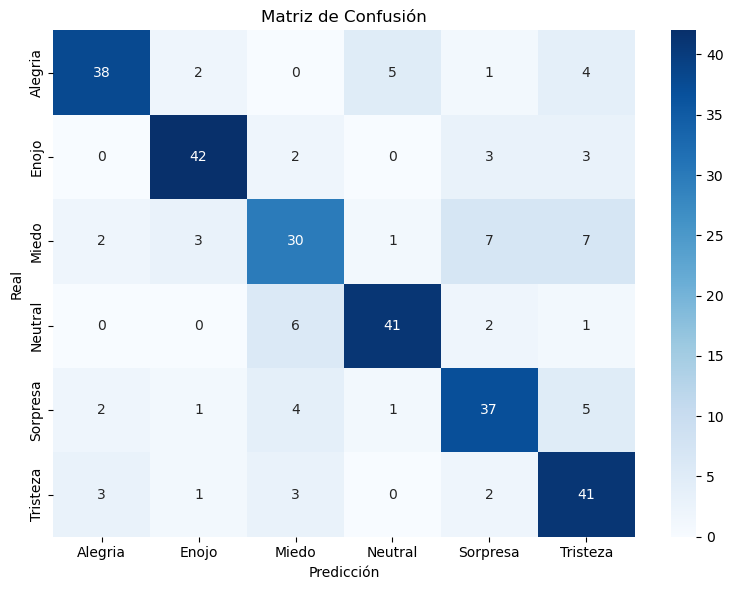

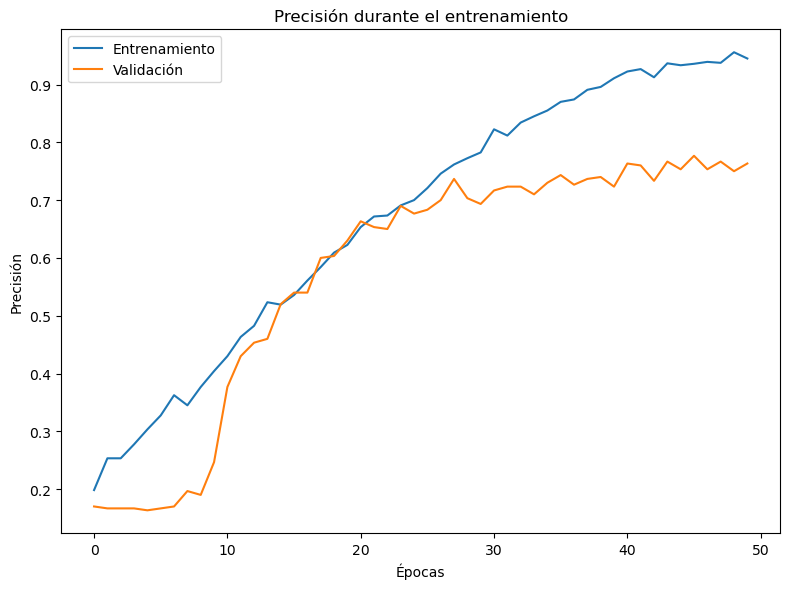

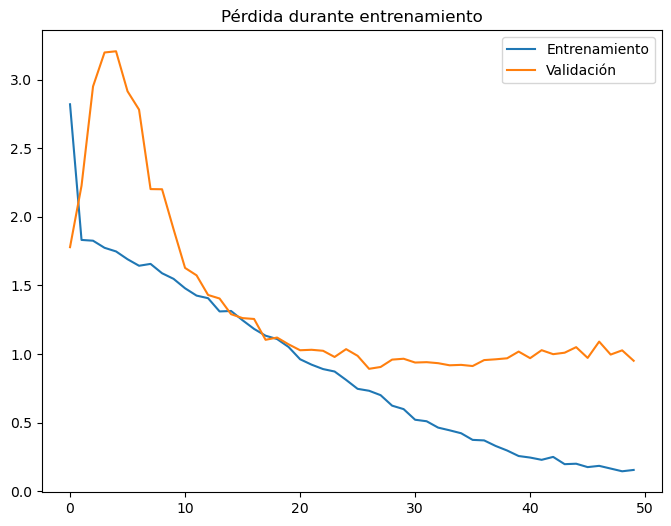

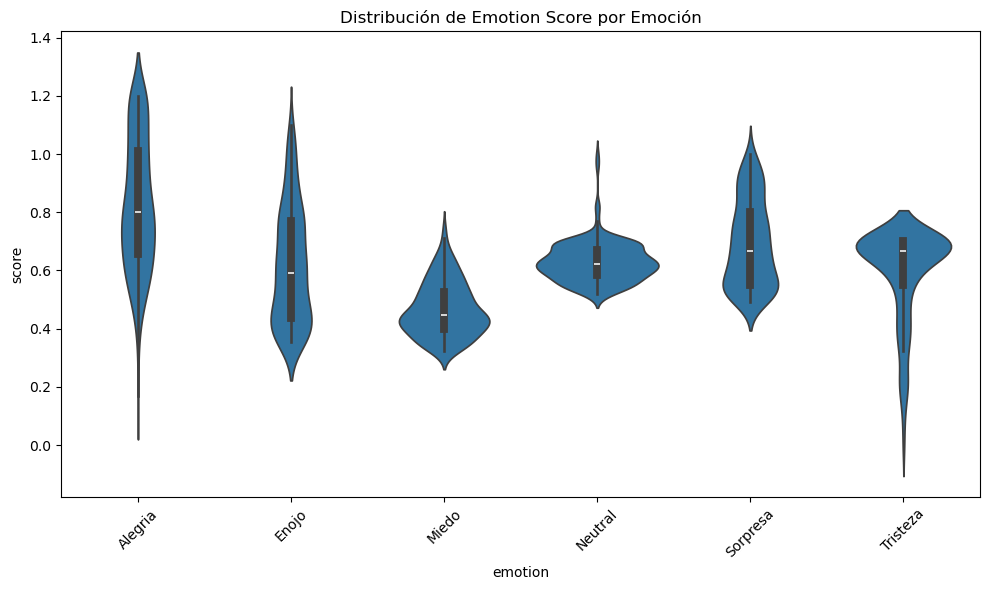

['label_encoder.pkl']

In [41]:
import os
import librosa
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report, confusion_matrix
import tensorflow as tf
from tensorflow.keras import layers, models, callbacks
from skimage.transform import resize
import joblib
from collections import defaultdict
import soundfile as sf
import random

# =================== CONFIG ===================
DATASET_PATH = "Dataset_comprimido"
TARGET_SIZE = (13, 100)  # (n_mfcc, frames) - tamaño fijo para los MFCCs
SAMPLE_RATE = 16000
DURATION = 2.2          # Duración fija en segundos
DURATION_MIN = 1.8
DURATION_MAX = 2.6
N_MFCC = 13             # Número de coeficientes MFCC
HOP_LENGTH = 256        # Para calcular fixed_frames
FIXED_FRAMES = int((SAMPLE_RATE * DURATION) / HOP_LENGTH)  # ~138 frames para 2.2s
EMOTIONS = ['Alegria', 'Enojo', 'Miedo', 'Neutral', 'Sorpresa','Tristeza']
MAX_FILES_PER_CLASS = 250
OUTPUT_FILE = "audios_seleccionados.csv"
OUTPUT_AUDIO_DIR = "Dataset_normalizado"

# =================== PARÁMETROS POR EMOCIÓN (PERÚ) ===================
EMOTION_PARAMS_PERU = {
    'Alegria': {
        'target_pitch': (220, 300),
        'target_energy': (-18, -8),
        'target_spec_centroid': (1500, 2500),
        'target_zcr': (0.08, 0.15),
        'weight': 1.2
    },
    'Enojo': {
        'target_pitch': (250, 350),
        'target_energy': (-15, -5),
        'target_spec_centroid': (2200, 3200),
        'target_zcr': (0.15, 0.25),
        'weight': 1.1
    },
    'Miedo': {
        'target_pitch': (170, 260),
        'target_energy': (-23, -13),
        'target_spec_centroid': (2900, 3900),
        'target_zcr': (0.11, 0.19),
        'weight': 1.0
    },
    'Tristeza': {
        'target_pitch': (90, 140),
        'target_energy': (-28, -23),
        'target_spec_centroid': (700, 1400),
        'target_zcr': (0.04, 0.09),
        'weight': 1.0
    },
    'Sorpresa': {
        'target_pitch': (210, 330),
        'target_energy': (-20, -10),
        'target_spec_centroid': (1900, 2900),
        'target_zcr': (0.09, 0.17),
        'weight': 1.0
    },
    'Neutral': {
        'target_pitch': (140, 190),
        'target_energy': (-23, -16),
        'target_spec_centroid': (900, 1400),
        'target_zcr': (0.06, 0.10),
        'weight': 1.0
    }
}

# Ajustar parámetros para las emociones que estamos usando
EMOTION_PARAMS = {k: v for k, v in EMOTION_PARAMS_PERU.items() if k in EMOTIONS}

# =================== FUNCIONES ===================

def normalize_volume(y, target_peak=0.9, threshold=0.01, max_gain=20.0):
    """
    Normalización mejorada con protección contra aumento excesivo
    
    Args:
        y: Señal de audio
        target_peak: Pico objetivo (0.9 = -0.915 dBFS)
        threshold: Umbral para aplicar aumento (default 0.01 = -40 dBFS)
        max_gain: Ganancia máxima permitida en dB (evita amplificar ruido)
    """
    peak = np.max(np.abs(y))
    
    if peak < 1e-6:  # Evitar división por cero
        return y
    
    # Calcular ganancia necesaria en dB
    needed_gain_db = 20 * np.log10(target_peak / peak)
    
    # Limitar la ganancia máxima
    applied_gain_db = min(needed_gain_db, max_gain)
    
    # Aplicar ganancia
    gain_linear = 10 ** (applied_gain_db / 20)
    y_normalized = y * gain_linear
    
    # Normalización RMS adicional para volumen consistente
    # rms = np.sqrt(np.mean(y**2))
    # y_normalized = y_normalized * (target_rms/rms) if rms > 0 else y_normalized
    
    return y_normalized

def extract_mfcc_features(y, sr=SAMPLE_RATE, n_mfcc=N_MFCC, fixed_frames=FIXED_FRAMES):
    """Extrae características MFCC con tamaño estandarizado"""
    try:
        # Asegurar duración consistente
        y = librosa.util.fix_length(y, size=int(DURATION * sr))
        
        # Extraer MFCCs con parámetros fijos
        mfccs = librosa.feature.mfcc(
            y=y, 
            sr=sr, 
            n_mfcc=n_mfcc,
            n_fft=512,
            hop_length=HOP_LENGTH
        )
        
        # Extraer deltas
        delta = librosa.feature.delta(mfccs)
        delta2 = librosa.feature.delta(mfccs, order=2)
        
        # Ajustar tamaño temporal
        def resize_mfcc(mfcc, target_frames):
            if mfcc.shape[1] < target_frames:
                return np.pad(mfcc, ((0,0), (0, target_frames - mfcc.shape[1])))
            else:
                return mfcc[:, :target_frames]
        
        mfccs = resize_mfcc(mfccs, fixed_frames)
        delta = resize_mfcc(delta, fixed_frames)
        delta2 = resize_mfcc(delta2, fixed_frames)
        
        # Apilar canales (MFCC, delta, delta-delta)
        stacked = np.stack([mfccs, delta, delta2], axis=-1)
        
        # Normalización por instancia
        stacked = (stacked - np.mean(stacked)) / (np.std(stacked) + 1e-6)
        
        return stacked
    except Exception as e:
        print(f"Error procesando MFCC: {e}")
        return None

def augment_audio(y, sr=SAMPLE_RATE, target_duration=DURATION):
    """
    Función mejorada de aumento de datos que:
    1. Selecciona los mejores segmentos del audio basado en energía
    2. Completa la duración requerida con repeticiones inteligentes
    3. Aplica transformaciones de aumento más naturales
    """
    # 1. Encontrar los segmentos más energéticos (mejores partes)
    intervals = librosa.effects.split(y, top_db=20)
    if len(intervals) == 0:
        intervals = np.array([[0, len(y)]])
    
    # Calcular energía de cada segmento
    energies = []
    for start, end in intervals:
        segment = y[start:end]
        energies.append(np.mean(librosa.feature.rms(y=segment)))
    
    # Ordenar segmentos por energía (de mayor a menor)
    sorted_segments = [seg for _, seg in sorted(zip(energies, intervals), reverse=True)]
    
    # 2. Construir nuevo audio con los mejores segmentos
    new_audio = np.array([], dtype=y.dtype)
    remaining_samples = int(target_duration * sr) - len(y)
    
    # Completar con repeticiones inteligentes de los mejores segmentos
    while remaining_samples > 0 and len(sorted_segments) > 0:
        best_start, best_end = sorted_segments[0]
        best_segment = y[best_start:best_end]
        
        # Tomar una porción del mejor segmento (no más de lo necesario)
        take_samples = min(len(best_segment), remaining_samples)
        new_audio = np.concatenate([new_audio, best_segment[:take_samples]])
        remaining_samples -= take_samples
        
        # Rotar segmentos para variedad
        sorted_segments.append(sorted_segments.pop(0))
    
    # Si aún queda espacio, aplicar stretching temporal suave
    if remaining_samples > 0:
        stretch_factor = len(y) / (len(y) + remaining_samples)
        y_stretched = librosa.effects.time_stretch(y, rate=stretch_factor)
        new_audio = librosa.util.fix_length(y_stretched, size=int(target_duration * sr))
    else:
        new_audio = librosa.util.fix_length(np.concatenate([y, new_audio]), 
                                         size=int(target_duration * sr))
    
    # 3. Aplicar transformaciones de aumento más naturales
    transformations = [
        lambda x: x * (1 + np.random.uniform(-0.1, 0.1)),  # Pequeña variación de volumen
        lambda x: x + np.random.normal(0, 0.002, len(x)),  # Ruido muy suave
        lambda x: librosa.effects.pitch_shift(x, sr=sr, n_steps=np.random.uniform(-0.5, 0.5))
    ]
    
    # Aplicar 1-2 transformaciones aleatorias
    for transform in random.sample(transformations, k=np.random.randint(1, 3)):
        new_audio = transform(new_audio)
    
    # Normalizar volumen final
    new_audio = normalize_volume(new_audio)
    
    return new_audio

def calculate_score(audio_features, emotion):
    """Calcula el score basado en qué tan cerca están las características de los rangos objetivo"""
    params = EMOTION_PARAMS[emotion]
    score = 0
    
    # Pitch score (dentro del rango objetivo)
    pitch = audio_features['pitch']
    target_pitch_min, target_pitch_max = params['target_pitch']
    if target_pitch_min <= pitch <= target_pitch_max:
        pitch_score = 1.0
    else:
        # Penalización por estar fuera del rango
        distance = min(abs(pitch - target_pitch_min), abs(pitch - target_pitch_max))
        pitch_score = max(0, 1 - (distance / 100))  # Normalizar la distancia
    
    # Energy score (RMS en dB)
    energy_db = 10 * np.log10(audio_features['rms'] + 1e-6)  # Convertir a dB
    target_energy_min, target_energy_max = params['target_energy']
    if target_energy_min <= energy_db <= target_energy_max:
        energy_score = 1.0
    else:
        distance = min(abs(energy_db - target_energy_min), abs(energy_db - target_energy_max))
        energy_score = max(0, 1 - (distance / 5))  # Normalizar la distancia
    
    # Spectral Centroid score
    centroid = audio_features['centroid']
    target_centroid_min, target_centroid_max = params['target_spec_centroid']
    if target_centroid_min <= centroid <= target_centroid_max:
        centroid_score = 1.0
    else:
        distance = min(abs(centroid - target_centroid_min), abs(centroid - target_centroid_max))
        centroid_score = max(0, 1 - (distance / 500))  # Normalizar la distancia
    
    # ZCR score
    zcr = audio_features['zcr']
    target_zcr_min, target_zcr_max = params['target_zcr']
    if target_zcr_min <= zcr <= target_zcr_max:
        zcr_score = 1.0
    else:
        distance = min(abs(zcr - target_zcr_min), abs(zcr - target_zcr_max))
        zcr_score = max(0, 1 - (distance / 0.05))  # Normalizar la distancia
    
    # Score ponderado
    total_score = (pitch_score * 0.4 + energy_score * 0.3 + 
                  centroid_score * 0.2 + zcr_score * 0.1) * params['weight']
    
    return total_score

# =================== CARGA Y PROCESAMIENTO ===================
X, y = [], []
selected_info = []
count_per_class = defaultdict(int)
before_count = {}       # Archivos originales en cada carpeta
valid_count = {}        # Archivos válidos después de filtrar por duración
after_count = {}        # Archivos después de data augmentation
os.makedirs(OUTPUT_AUDIO_DIR, exist_ok=True)

for emotion in EMOTIONS:
    folder = os.path.join(DATASET_PATH, emotion)
    if not os.path.isdir(folder):
        continue
    
    # Contar archivos originales
    files = sorted(os.listdir(folder))
    before_count[emotion] = len([f for f in files if f.lower().endswith('.wav')])
    valid_count[emotion] = 0
    scored_files = []

    for fname in files:
        if fname.lower().endswith(".wav"):
            file_path = os.path.join(folder, fname.strip())
            y_temp, sr = librosa.load(file_path, sr=SAMPLE_RATE)
            y_temp, _ = librosa.effects.trim(y_temp, top_db=25)
            intervals = librosa.effects.split(y_temp, top_db=25)
            y_temp = np.concatenate([y_temp[start:end] for start, end in intervals])

            duration = librosa.get_duration(y=y_temp, sr=sr)
            if duration < DURATION_MIN or duration > DURATION_MAX:
                continue
                
            valid_count[emotion] += 1  # Contar archivos válidos

            y_temp = normalize_volume(y_temp)
            y_temp = librosa.util.fix_length(y_temp, size=int(DURATION * sr))

            pitch = librosa.yin(y_temp, fmin=50, fmax=400, sr=sr)
            pitch = pitch[pitch > 0]
            pitch_mean = np.mean(pitch) if len(pitch) > 0 else 0
            rms = np.mean(librosa.feature.rms(y=y_temp))
            zcr = np.mean(librosa.feature.zero_crossing_rate(y_temp))
            centroid = np.mean(librosa.feature.spectral_centroid(y=y_temp, sr=sr))

            audio_features = {
                'pitch': pitch_mean,
                'rms': rms,
                'zcr': zcr,
                'centroid': centroid
            }
            
            score = calculate_score(audio_features, emotion)
            
            scored_files.append({
                'score': score,
                'pitch': pitch_mean,
                'rms': rms,
                'zcr': zcr,
                'centroid': centroid,
                'file_path': file_path,
                'fname': fname.strip(),
                'emotion': emotion,
                'audio_data': y_temp
            })

    # Estadísticas antes de data augmentation
    print(f"  - Estadísticas para {emotion}:")
    print(f"  - Archivos originales: {before_count[emotion]}")
    print(f"  - Archivos válidos (duración correcta): {valid_count[emotion]}")
    if valid_count[emotion] > 0:
        print(f"Porcentaje válidos: {valid_count[emotion]/before_count[emotion]*100:.1f}%")
    else:
        print("No hay archivos válidos para esta emoción")

    top_files = sorted(scored_files, key=lambda x: -x['score'])[:MAX_FILES_PER_CLASS]

    # Agregar data augmentation si hay menos de MAX_FILES_PER_CLASS
    needed = MAX_FILES_PER_CLASS - len(top_files)
    if needed > 0 and len(top_files) > 0:
        print(f"  - Necesarios {needed} archivos adicionales por data augmentation")
        for i in range(needed):
            original = top_files[i % len(top_files)]
            augmented_y = augment_audio(original['audio_data'])
            aug_name = f"aug_{i}_{original['fname']}"
            top_files.append({**original, 'fname': aug_name, 'audio_data': augmented_y})
    else:
        print("No se necesitó data augmentation")

    after_count[emotion] = len(top_files)

    for item in top_files[:MAX_FILES_PER_CLASS]:
        mfcc_features = extract_mfcc_features(item['audio_data'])
        if mfcc_features is not None:
            X.append(mfcc_features)
            y.append(emotion)
            item['ruta'] = item['file_path']
            selected_info.append(item)
            count_per_class[emotion] += 1

            emotion_dir = os.path.join(OUTPUT_AUDIO_DIR, emotion)
            os.makedirs(emotion_dir, exist_ok=True)
            save_path = os.path.join(emotion_dir, item['fname'])
            sf.write(save_path, item['audio_data'], samplerate=SAMPLE_RATE)

selected_df = pd.DataFrame(selected_info)
selected_df.to_csv(OUTPUT_FILE, index=False)

# Mostrar estadística de conteo antes y después
print("Resumen estadístico de audios por emoción:")
print(f"{'Emoción':<12} | {'Originales':^9} | {'Válidos':^7} | {'Final':^5}")
print("-" * 45)
for emotion in EMOTIONS:
    print(f"{emotion:<12} | {before_count.get(emotion, 0):^9} | {valid_count.get(emotion, 0):^7} | {after_count.get(emotion, 0):^5}")

# Calcular porcentaje de uso de archivos válidos
print("Porcentaje de archivos válidos utilizados:")
for emotion in EMOTIONS:
    valid = valid_count.get(emotion, 0)
    final = after_count.get(emotion, 0)
    if valid > 0:
        used = min(valid, MAX_FILES_PER_CLASS)
        pct_used = used / valid * 100
        augmented = max(0, final - valid)
        print(f"{emotion:<12}: {used}/{valid} ({pct_used:.1f}% usado) + {augmented} aumentados")
    else:
        print(f"{emotion:<12}: No hay archivos válidos")

# =================== MODELO CNN PARA MFCCs ===================
X = np.array(X)
y = np.array(y)

# Verificar las dimensiones reales de los datos
print(f"Forma de los datos de entrada: {X.shape}")  # Debería ser (n_samples, 13, frames, 3)

# Encoding de etiquetas
le = LabelEncoder()
y_encoded = le.fit_transform(y)
print("Distribución de clases:", dict(zip(le.classes_, np.bincount(y_encoded))))

# Split de datos
X_train, X_test, y_train, y_test = train_test_split(
    X, y_encoded, test_size=0.2, stratify=y_encoded, random_state=42
)

# Pesos de clase
weights = compute_class_weight('balanced', classes=np.unique(y_train), y=y_train)
class_weights = dict(zip(np.unique(y_train), weights))

# Aplicar los pesos adicionales de EMOTION_PARAMS
for emotion, weight in EMOTION_PARAMS.items():
    if emotion in le.classes_:
        idx = np.where(le.classes_ == emotion)[0][0]
        if idx in class_weights:
            class_weights[idx] *= weight['weight']

# Arquitectura del modelo adaptada para MFCCs
input_shape = X_train.shape[1:]  # Usamos las dimensiones reales de los datos

# Después de generar todos los MFCCs (antes del entrenamiento)
shapes = [x.shape for x in X]
unique_shapes = set(shapes)

if len(unique_shapes) == 1:
    print(f"Todos los espectrogramas tienen la misma forma: {unique_shapes.pop()}")
else:
    print("Existe variación en las dimensiones:")
    for shape in unique_shapes:
        count = shapes.count(shape)
        print(f"- Forma {shape}: {count} muestras")
        
model = models.Sequential([
    layers.Input(shape=input_shape),
    
    # Primera capa convolucional - extrae patrones frecuenciales
    layers.Conv2D(32, (3, 3), padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2, 2), padding='same'),
    layers.Dropout(0.3),
    
    # Segunda capa convolucional - extrae patrones más complejos
    layers.Conv2D(64, (3, 3), padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2, 2), padding='same'),
    layers.Dropout(0.3),
    
    # Tercera capa convolucional
    layers.Conv2D(128, (3, 3), padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2, 2), padding='same'),
    layers.Dropout(0.4),
    
    # Aplanar para capas densas
    layers.Flatten(),
    
    # Capa densa con tamaño ajustado dinámicamente
    layers.Dense(256, activation='relu'),
    layers.Dropout(0.3),
    
    # Capa de salida
    layers.Dense(len(EMOTIONS), activation='softmax')
])

model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.0005),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# Callbacks
early_stop = callbacks.EarlyStopping(patience=6, restore_best_weights=True)
reduce_lr = callbacks.ReduceLROnPlateau(patience=3, factor=0.5, verbose=1)

model.summary()

# Entrenamiento sin early_stop
history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=50,
    batch_size=32,
    class_weight=class_weights
)

# =================== EVALUACIÓN ===================
y_pred = model.predict(X_test).argmax(axis=1)
print("Reporte de clasificación:")
print(classification_report(y_test, y_pred, target_names=le.classes_))

# =================== Matriz de Confusión ===================
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='d', xticklabels=le.classes_, yticklabels=le.classes_, cmap='Blues')
plt.xlabel("Predicción")
plt.ylabel("Real")
plt.title("Matriz de Confusión")
plt.tight_layout()
plt.savefig("matriz_confusion.png")
plt.show()

# =============Gráfico de precisión=========================
plt.figure(figsize=(8,6))
plt.plot(history.history['accuracy'], label="Entrenamiento")
plt.plot(history.history['val_accuracy'], label="Validación")
plt.title("Precisión durante el entrenamiento")
plt.xlabel("Épocas")
plt.ylabel("Precisión")
plt.legend()
plt.tight_layout()
plt.savefig("precision_entrenamiento.png")
plt.show()

#=============Pérdida durante el entrenamiento==============
plt.figure(figsize=(8,6))
plt.plot(history.history['loss'], label='Entrenamiento')
plt.plot(history.history['val_loss'], label='Validación')
plt.title('Pérdida durante entrenamiento')
plt.legend()
plt.show()

# =================== VIOLIN PLOT ===================
plt.figure(figsize=(10,6))
sns.violinplot(data=selected_df, x='emotion', y='score')
plt.title("Distribución de Emotion Score por Emoción")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()
# Guardado del modelo
model.save("modelo_emociones_mfcc_cnn.h5")
joblib.dump(le, "label_encoder.pkl")

## Ejecución de diversos modelos con el mismo dataset

=== Cargando y procesando datos ===
Procesando: Alegria


Alegria: 100%|███████████████████████████████████████████████████████████████████████| 773/773 [01:59<00:00,  6.47it/s]


Procesando: Enojo


Enojo: 100%|█████████████████████████████████████████████████████████████████████████| 766/766 [01:53<00:00,  6.75it/s]


Procesando: Miedo


Miedo: 100%|█████████████████████████████████████████████████████████████████████████| 760/760 [01:55<00:00,  6.58it/s]


Procesando: Neutral


Neutral: 100%|███████████████████████████████████████████████████████████████████████| 772/772 [01:59<00:00,  6.48it/s]


Procesando: Sorpresa


Sorpresa: 100%|██████████████████████████████████████████████████████████████████████| 766/766 [01:56<00:00,  6.59it/s]


Procesando: Tristeza


Tristeza: 100%|██████████████████████████████████████████████████████████████████████| 774/774 [02:01<00:00,  6.39it/s]



Características guardadas en 'audio_features.csv'

=== Entrenando modelos de Machine Learning ===


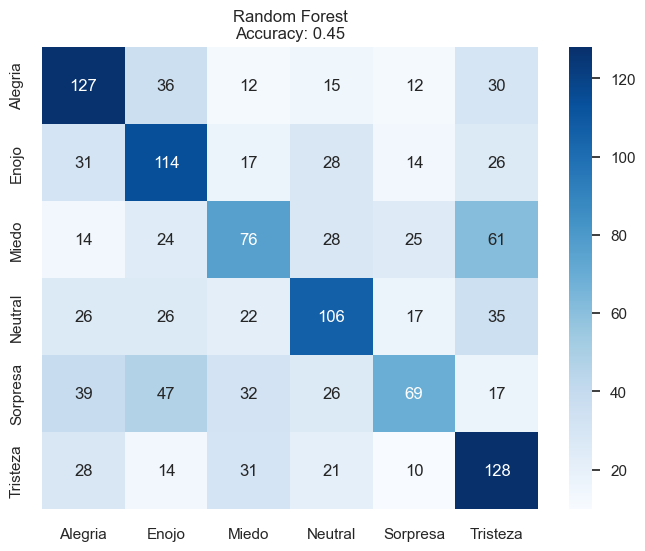


Reporte Random Forest:
              precision    recall  f1-score   support

     Alegria       0.48      0.55      0.51       232
       Enojo       0.44      0.50      0.46       230
       Miedo       0.40      0.33      0.36       228
     Neutral       0.47      0.46      0.46       232
    Sorpresa       0.47      0.30      0.37       230
    Tristeza       0.43      0.55      0.48       232

    accuracy                           0.45      1384
   macro avg       0.45      0.45      0.44      1384
weighted avg       0.45      0.45      0.44      1384



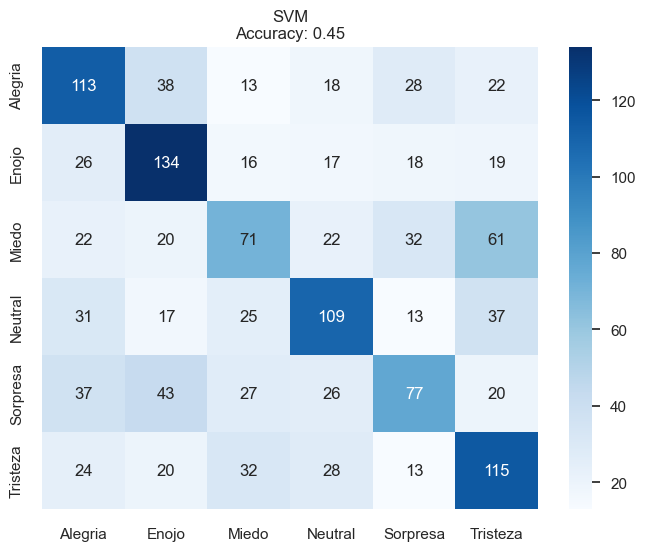


Reporte SVM:
              precision    recall  f1-score   support

     Alegria       0.45      0.49      0.47       232
       Enojo       0.49      0.58      0.53       230
       Miedo       0.39      0.31      0.34       228
     Neutral       0.50      0.47      0.48       232
    Sorpresa       0.43      0.33      0.37       230
    Tristeza       0.42      0.50      0.45       232

    accuracy                           0.45      1384
   macro avg       0.44      0.45      0.44      1384
weighted avg       0.44      0.45      0.44      1384



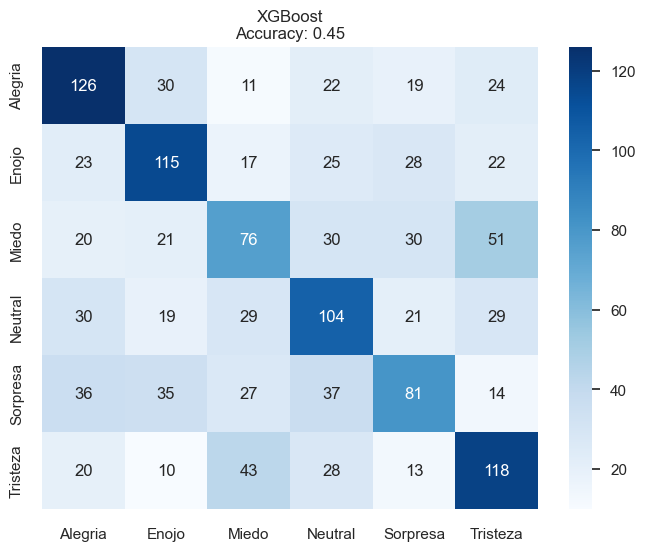


Reporte XGBoost:
              precision    recall  f1-score   support

     Alegria       0.49      0.54      0.52       232
       Enojo       0.50      0.50      0.50       230
       Miedo       0.37      0.33      0.35       228
     Neutral       0.42      0.45      0.44       232
    Sorpresa       0.42      0.35      0.38       230
    Tristeza       0.46      0.51      0.48       232

    accuracy                           0.45      1384
   macro avg       0.45      0.45      0.45      1384
weighted avg       0.45      0.45      0.45      1384



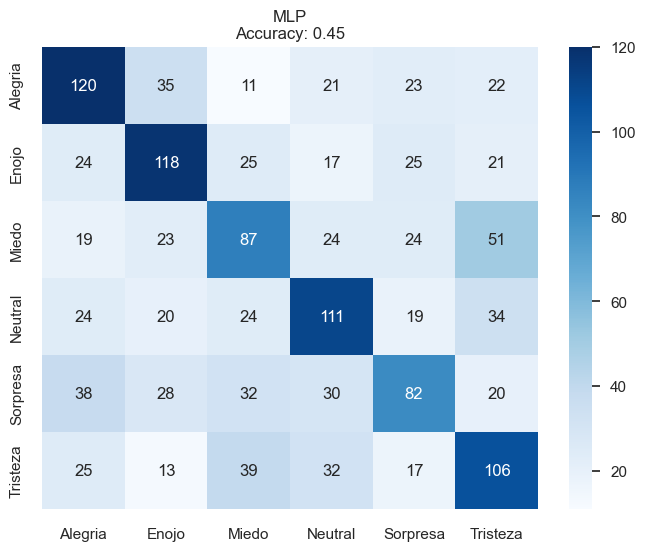


Reporte MLP:
              precision    recall  f1-score   support

     Alegria       0.48      0.52      0.50       232
       Enojo       0.50      0.51      0.51       230
       Miedo       0.40      0.38      0.39       228
     Neutral       0.47      0.48      0.48       232
    Sorpresa       0.43      0.36      0.39       230
    Tristeza       0.42      0.46      0.44       232

    accuracy                           0.45      1384
   macro avg       0.45      0.45      0.45      1384
weighted avg       0.45      0.45      0.45      1384


Mejor modelo ML: MLP con accuracy 0.45

=== Entrenando red neuronal ===
Epoch 1/50
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 0.2076 - loss: 1.8098 - val_accuracy: 0.3498 - val_loss: 1.6338
Epoch 2/50
81/81 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3319 - loss: 1.6300 - val_accuracy: 0.3700 - val_loss: 1.5845
Epoch 3/50
81/81 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3452 - loss: 1.5887 - val_accuracy: 0.3932 - val_loss:

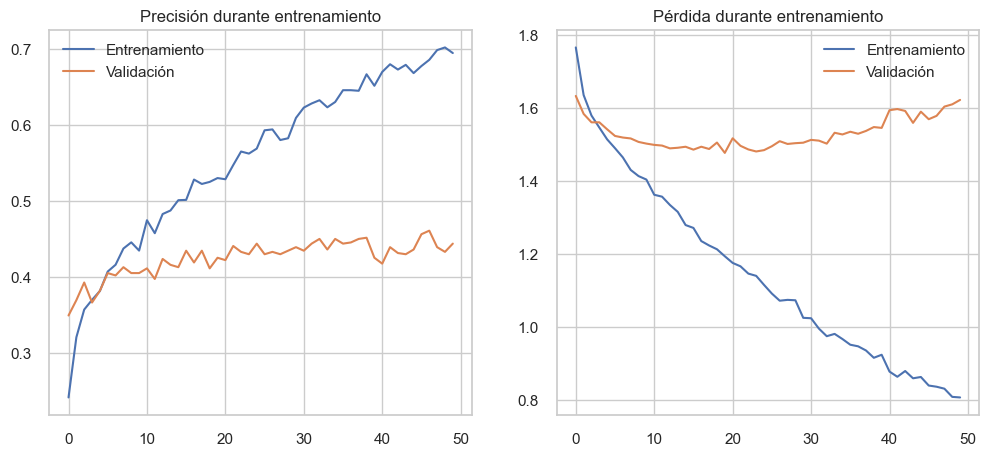

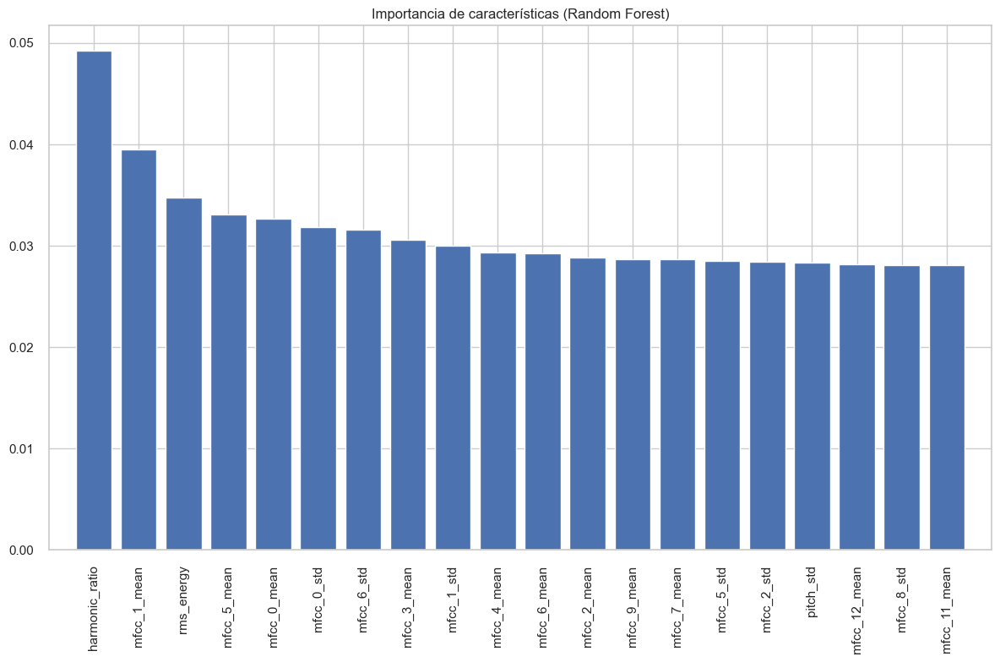

In [20]:
import os
import numpy as np
import pandas as pd
import librosa
import librosa.display
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from xgboost import XGBClassifier
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.utils import to_categorical
from tqdm import tqdm
import warnings

# Configuración
warnings.filterwarnings('ignore')
plt.style.use('seaborn-v0_8')
sns.set_theme(style="whitegrid")

# 1. Extracción de Características (Versión Mejorada)
def extract_audio_features(file_path, sr=22050, duration=4):
    """Extrae características avanzadas del audio"""
    try:
        audio, sr = librosa.load(file_path, sr=sr, duration=duration)
        
        # Padding si es necesario
        if len(audio) < sr * duration:
            audio = np.pad(audio, (0, max(0, sr * duration - len(audio))), 'constant')
        
        features = {}
        
        # 1. Características temporales
        features['zcr_mean'] = np.mean(librosa.feature.zero_crossing_rate(y=audio))
        features['rms_energy'] = np.mean(librosa.feature.rms(y=audio))
        
        # 2. Características espectrales
        stft = np.abs(librosa.stft(audio))
        spectral_centroid = librosa.feature.spectral_centroid(y=audio, sr=sr)
        spectral_bandwidth = librosa.feature.spectral_bandwidth(y=audio, sr=sr)
        
        features.update({
            'spectral_centroid_mean': np.mean(spectral_centroid),
            'spectral_bandwidth_mean': np.mean(spectral_bandwidth),
            'spectral_rolloff_mean': np.mean(librosa.feature.spectral_rolloff(y=audio, sr=sr))
        })
        
        # 3. MFCCs (13 coeficientes + estadísticas)
        mfccs = librosa.feature.mfcc(y=audio, sr=sr, n_mfcc=13)
        for i in range(mfccs.shape[0]):
            features[f'mfcc_{i}_mean'] = np.mean(mfccs[i])
            features[f'mfcc_{i}_std'] = np.std(mfccs[i])
        
        # 4. Análisis de tono
        pitches, magnitudes = librosa.piptrack(y=audio, sr=sr)
        pitch = pitches[magnitudes > np.median(magnitudes)]
        features['pitch_mean'] = np.mean(pitch) if len(pitch) > 0 else 0
        features['pitch_std'] = np.std(pitch) if len(pitch) > 0 else 0
        
        # 5. Características de calidad vocal
        harmonic, percussive = librosa.effects.hpss(audio)
        features['harmonic_ratio'] = np.sum(harmonic**2) / (np.sum(audio**2) + 1e-6)
        
        return features
    
    except Exception as e:
        print(f"Error procesando {file_path}: {str(e)}")
        return None

# 2. Carga y Procesamiento del Dataset
def load_dataset(base_path, emotions):
    """Carga el dataset y extrae características"""
    data = []
    
    for emotion in emotions:
        emotion_path = os.path.join(base_path, emotion)
        if not os.path.exists(emotion_path):
            continue
            
        print(f"Procesando: {emotion}")
        files = [f for f in os.listdir(emotion_path) if f.endswith(('.wav', '.mp3'))]
        
        for file in tqdm(files, desc=emotion):
            file_path = os.path.join(emotion_path, file)
            features = extract_audio_features(file_path)
            if features:
                features['emotion'] = emotion
                data.append(features)
    
    return pd.DataFrame(data)

# 3. Modelado con Machine Learning
def train_ml_models(X_train, X_test, y_train, y_test, classes):
    """Entrena y evalúa modelos tradicionales"""
    models = {
        'Random Forest': RandomForestClassifier(n_estimators=200, random_state=42),
        'SVM': SVC(kernel='rbf', C=10, gamma=0.01, random_state=42),
        'XGBoost': XGBClassifier(n_estimators=200, learning_rate=0.1, random_state=42),
        'MLP': MLPClassifier(hidden_layer_sizes=(128, 64), max_iter=500, random_state=42)
    }
    
    results = {}
    
    for name, model in models.items():
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        acc = accuracy_score(y_test, y_pred)
        results[name] = acc
        
        # Visualización
        plt.figure(figsize=(8, 6))
        cm = confusion_matrix(y_test, y_pred)
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
                    xticklabels=classes, yticklabels=classes)
        plt.title(f'{name}\nAccuracy: {acc:.2f}')
        plt.show()
        
        print(f"\nReporte {name}:")
        print(classification_report(y_test, y_pred, target_names=classes))
    
    return results

# 4. Modelado con Red Neuronal
def build_nn_model(input_shape, num_classes):
    """Crea un modelo de red neuronal"""
    model = Sequential([
        Dense(256, activation='relu', input_shape=(input_shape,)),
        Dropout(0.3),
        Dense(128, activation='relu'),
        Dropout(0.2),
        Dense(num_classes, activation='softmax')
    ])
    
    model.compile(optimizer='adam',
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])
    
    return model

# 5. Visualización Avanzada
def plot_feature_importance(model, feature_names, title):
    """Muestra la importancia de características"""
    if hasattr(model, 'feature_importances_'):
        importances = model.feature_importances_
        indices = np.argsort(importances)[::-1]
        
        plt.figure(figsize=(12, 8))
        plt.title(title)
        plt.bar(range(20), importances[indices[:20]], align='center')
        plt.xticks(range(20), [feature_names[i] for i in indices[:20]], rotation=90)
        plt.xlim([-1, 20])
        plt.tight_layout()
        plt.show()

# Función Principal
def main():
    # Configuración
    DATA_PATH = "Dataset_comprimido"
    EMOTIONS = ['Alegria', 'Enojo', 'Miedo', 'Neutral', 'Sorpresa', 'Tristeza']
    
    # 1. Cargar y procesar datos
    print("=== Cargando y procesando datos ===")
    df = load_dataset(DATA_PATH, EMOTIONS)
    
    if df.empty:
        print("No se encontraron datos válidos.")
        return
    
    # Guardar características
    df.to_csv('audio_features.csv', index=False)
    print("\nCaracterísticas guardadas en 'audio_features.csv'")
    
    # 2. Preparar datos para modelos
    X = df.drop('emotion', axis=1)
    y = df['emotion']
    
    # Codificar etiquetas
    le = LabelEncoder()
    y_encoded = le.fit_transform(y)
    classes = le.classes_
    
    # Escalar características
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    
    # Dividir datos
    X_train, X_test, y_train, y_test = train_test_split(
        X_scaled, y_encoded, test_size=0.3, random_state=42, stratify=y_encoded)
    
    # 3. Entrenar modelos de ML
    print("\n=== Entrenando modelos de Machine Learning ===")
    ml_results = train_ml_models(X_train, X_test, y_train, y_test, classes)
    
    # Mostrar mejor modelo ML
    best_ml = max(ml_results, key=ml_results.get)
    print(f"\nMejor modelo ML: {best_ml} con accuracy {ml_results[best_ml]:.2f}")
    
    # 4. Entrenar red neuronal
    print("\n=== Entrenando red neuronal ===")
    y_train_cat = to_categorical(y_train)
    y_test_cat = to_categorical(y_test)
    
    model = build_nn_model(X_train.shape[1], len(classes))
    history = model.fit(X_train, y_train_cat, 
                        epochs=50, 
                        batch_size=32,
                        validation_split=0.2,
                        verbose=1)
    
    # Evaluar red neuronal
    _, nn_acc = model.evaluate(X_test, y_test_cat, verbose=0)
    print(f"\nPrecisión red neuronal: {nn_acc:.2f}")
    
    # 5. Visualización de resultados
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Entrenamiento')
    plt.plot(history.history['val_accuracy'], label='Validación')
    plt.title('Precisión durante entrenamiento')
    plt.legend()
    
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Entrenamiento')
    plt.plot(history.history['val_loss'], label='Validación')
    plt.title('Pérdida durante entrenamiento')
    plt.legend()
    plt.show()
    
    # 6. Importancia de características (ejemplo con Random Forest)
    rf = RandomForestClassifier(n_estimators=200, random_state=42)
    rf.fit(X_train, y_train)
    plot_feature_importance(rf, X.columns, 'Importancia de características (Random Forest)')

if __name__ == "__main__":
    main()

## Codigo ideal con YAMNet (muy usado en reconocimiento de audios)

In [11]:
#!pip install tensorflow_hub

ya codificados: Counter({'Tristeza': 774, 'Alegria': 773, 'Neutral': 772, 'Enojo': 766, 'Sorpresa': 766, 'Miedo': 760})
ya codificados: Counter({5: 774, 0: 773, 3: 772, 1: 766, 4: 766, 2: 760})

--- Reporte de Clasificación ---
              precision    recall  f1-score   support

     Alegria       0.37      0.30      0.33       172
       Enojo       0.44      0.38      0.41       162
       Miedo       0.26      0.26      0.26       135
     Neutral       0.39      0.47      0.42       151
    Sorpresa       0.34      0.35      0.35       145
    Tristeza       0.35      0.39      0.37       158

    accuracy                           0.36       923
   macro avg       0.36      0.36      0.36       923
weighted avg       0.36      0.36      0.36       923

✅ Audios procesados correctamente: 4611 / total


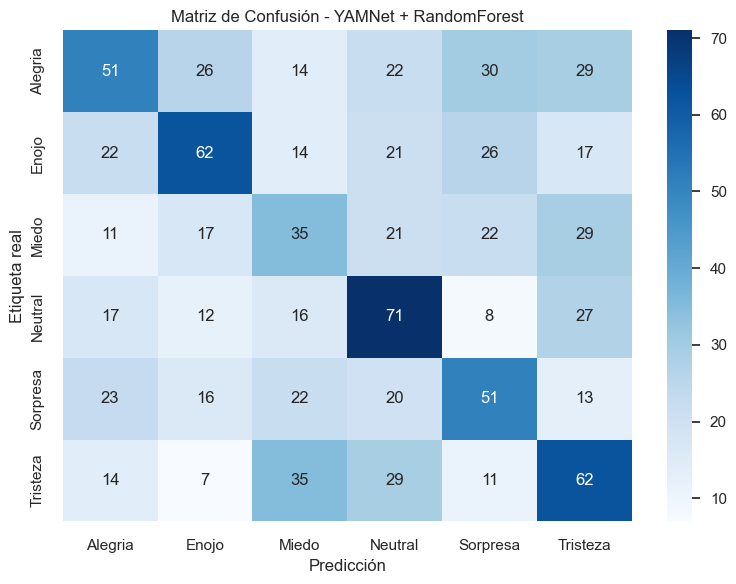

In [40]:
import os
import numpy as np
import librosa
import tensorflow_hub as hub
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

from collections import Counter

# Cargar YAMNet desde TensorFlow Hub
yamnet_model = hub.load("https://tfhub.dev/google/yamnet/1")

# Emociones esperadas en el dataset
emotion_labels = ['Alegria', 'Enojo', 'Miedo', 'Neutral', 'Sorpresa', 'Tristeza']
dataset_path = 'Dataset_comprimido/'

# Función para extraer embedding promedio por archivo de audio
def extract_yamnet_embedding(file_path):
    try:
        waveform, sr = librosa.load(file_path, sr=16000, mono=True)
        if len(waveform) == 0:
            return None
        scores, embeddings, spectrogram = yamnet_model(waveform)
        emb = np.mean(embeddings.numpy(), axis=0)
        if emb.shape[0] != 1024:
            return None
        return emb
    except Exception as e:
        print(f"❌ Error procesando {file_path}: {e}")
        return None


# Recorrer dataset y generar X, y
X, y = [], []
for label in emotion_labels:
    folder_path = os.path.join(dataset_path, label)
    for file in os.listdir(folder_path):
        if file.endswith('.wav'):
            emb = extract_yamnet_embedding(os.path.join(folder_path, file))
            if emb is not None and emb.shape == (1024,):
                X.append(emb)
                y.append(label)

print(f'ya codificados: {Counter(y)}')  # ← ya codificados

# Codificar etiquetas y dividir en train/test
X = np.array(X)
y = LabelEncoder().fit_transform(y)
print(f'ya codificados: {Counter(y)}')  # ← ya codificados
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Entrenar clasificador (Random Forest)
clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(X_train, y_train)

# Evaluar
y_pred = clf.predict(X_test)
print("\n--- Reporte de Clasificación ---")
print(classification_report(y_test, y_pred, target_names=emotion_labels))

print(f"✅ Audios procesados correctamente: {len(X)} / total")

# Matriz de confusión
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=emotion_labels, yticklabels=emotion_labels)
plt.xlabel("Predicción")
plt.ylabel("Etiqueta real")
plt.title("Matriz de Confusión - YAMNet + RandomForest")
plt.tight_layout()
plt.show()


## Pipeline Óptimo de Preprocesamiento de Audio para Redes Neuronales

In [ ]:
#!pip install noisereduce pywavelets joblib

In [28]:
import os
import numpy as np
import pandas as pd
import librosa
import soundfile as sf
import noisereduce as nr
import pywt
from tqdm import tqdm
from sklearn.preprocessing import StandardScaler
from concurrent.futures import ThreadPoolExecutor
import joblib

class AudioOptimizer:
    def __init__(self, target_length=3.0, sr=22050, n_mfcc=40):
        self.target_length = target_length
        self.sr = sr
        self.n_mfcc = n_mfcc
        self.scaler = StandardScaler()
        self.is_scaler_fitted = False

    def process_dataset(self, input_dir, output_dir, n_workers=4):
        """
        Procesa todo el dataset y guarda los resultados optimizados
        """
        # Crear estructura de directorios
        os.makedirs(output_dir, exist_ok=True)
        
        # Recolectar rutas de archivos manteniendo estructura de carpetas
        file_paths = []
        for root, dirs, files in os.walk(input_dir):
            for file in files:
                if file.lower().endswith('.wav'):
                    rel_path = os.path.relpath(root, input_dir)
                    os.makedirs(os.path.join(output_dir, rel_path), exist_ok=True)
                    file_paths.append({
                        'input': os.path.join(root, file),
                        'output': os.path.join(output_dir, rel_path, f"opt_{file.replace('.mp3', '.npy')}")
                    })

        # Procesamiento en paralelo
        with ThreadPoolExecutor(max_workers=n_workers) as executor:
            list(tqdm(
                executor.map(self._process_file, file_paths),
                total=len(file_paths),
                desc="Optimizando audios"
            ))

        # Guardar el scaler para uso futuro
        if self.is_scaler_fitted:
            scaler_path = os.path.join(output_dir, 'scaler.pkl')
            joblib.dump(self.scaler, scaler_path)
            print(f"\nScaler guardado en: {scaler_path}")

    def _process_file(self, file_info):
        """Procesa un archivo individual"""
        try:
            # Cargar y optimizar el audio
            features = self.optimize_audio(file_info['input'])
            
            # Guardar características en formato numpy
            np.save(file_info['output'], features)
            return True
        except Exception as e:
            print(f"\nError procesando {file_info['input']}: {str(e)}")
            return False

    def optimize_audio(self, audio_path):
        """Pipeline completo de optimización para un archivo de audio"""
        # 1. Carga y preprocesamiento básico
        audio, sr = librosa.load(audio_path, sr=self.sr)
        
        # 2. Normalización y limpieza
        audio = self._normalize_audio(audio)
        audio = self._remove_noise(audio, sr)
        
        # 3. Extracción de características condensadas
        features = self._extract_features(audio, sr)
        
        return features

    def _normalize_audio(self, audio, max_peak=0.99):
        """Normalización inteligente con prevención de clipping"""
        peak = np.max(np.abs(audio))
        if peak > max_peak:
            audio = audio * (max_peak / peak)
        return audio

    def _remove_noise(self, audio, sr, stationary=True):
        """Reducción adaptativa de ruido"""
        return nr.reduce_noise(y=audio, sr=sr, stationary=stationary)

    def _extract_features(self, audio, sr):
        """Extracción de características condensadas"""
        # Asegurar longitud consistente
        target_samples = int(self.target_length * sr)
        audio = self._pad_or_trim(audio, target_samples)
        
        # 1. MFCCs con derivadas
        mfccs = librosa.feature.mfcc(y=audio, sr=sr, n_mfcc=self.n_mfcc)
        delta_mfccs = librosa.feature.delta(mfccs)
        delta2_mfccs = librosa.feature.delta(mfccs, order=2)
        
        # 2. Características espectrales
        spectral_centroid = librosa.feature.spectral_centroid(y=audio, sr=sr)
        spectral_bandwidth = librosa.feature.spectral_bandwidth(y=audio, sr=sr)
        spectral_contrast = librosa.feature.spectral_contrast(y=audio, sr=sr)
        spectral_rolloff = librosa.feature.spectral_rolloff(y=audio, sr=sr)
        
        # 3. Características temporales
        zero_crossing_rate = librosa.feature.zero_crossing_rate(audio)
        rms_energy = librosa.feature.rms(y=audio)
        
        # 4. Descomposición wavelet
        cA, cD = pywt.dwt(audio, 'db4')
        wavelet_features = np.concatenate([cA[:100], cD[:100]])
        
        # 5. Pooling temporal
        def temporal_pooling(feature):
            return np.concatenate([
                np.mean(feature, axis=1),
                np.std(feature, axis=1),
                np.max(feature, axis=1),
                np.min(feature, axis=1)
            ])
        
        # Concatenar todas las características
        features = np.concatenate([
            temporal_pooling(mfccs),
            temporal_pooling(delta_mfccs),
            temporal_pooling(delta2_mfccs),
            temporal_pooling(spectral_centroid),
            temporal_pooling(spectral_bandwidth),
            temporal_pooling(spectral_contrast),
            temporal_pooling(spectral_rolloff),
            temporal_pooling(zero_crossing_rate),
            temporal_pooling(rms_energy),
            wavelet_features
        ])
        
        # Normalización (fit solo en el primer lote)
        if not self.is_scaler_fitted:
            self.scaler.fit(features.reshape(1, -1))
            self.is_scaler_fitted = True
            
        return self.scaler.transform(features.reshape(1, -1)).flatten()

    def _pad_or_trim(self, audio, target_length):
        """Ajusta la longitud del audio al objetivo"""
        if len(audio) > target_length:
            return audio[:target_length]
        return np.pad(audio, (0, max(0, target_length - len(audio))), 'constant')

# Configuración y ejecución
if __name__ == "__main__":
    # Parámetros configurables
    CONFIG = {
        'input_dir': 'Dataset_comprimido',  # Ruta a tu dataset original
        'output_dir': 'Dataset_condensado_optimizado',  # Ruta para el dataset procesado
        'target_length': 2.5,  # Duración objetivo en segundos
        'sample_rate': 22050,  # Tasa de muestreo
        'n_workers': 6,  # Número de procesos paralelos
        'n_mfcc': 40  # Número de coeficientes MFCC
    }

    print("=== Iniciando pipeline de optimización de audio ===")
    print(f"Directorio de entrada: {CONFIG['input_dir']}")
    print(f"Directorio de salida: {CONFIG['output_dir']}")
    print(f"Configuración: {CONFIG}")

    # Crear y ejecutar el optimizador
    optimizer = AudioOptimizer(
        target_length=CONFIG['target_length'],
        sr=CONFIG['sample_rate'],
        n_mfcc=CONFIG['n_mfcc']
    )

    optimizer.process_dataset(
        input_dir=CONFIG['input_dir'],
        output_dir=CONFIG['output_dir'],
        n_workers=CONFIG['n_workers']
    )

    print("\n=== Proceso completado ===")
    print(f"Dataset optimizado guardado en: {CONFIG['output_dir']}")

=== Iniciando pipeline de optimización de audio ===
Directorio de entrada: Dataset_comprimido
Directorio de salida: Dataset_condensado_optimizado
Configuración: {'input_dir': 'Dataset_comprimido', 'output_dir': 'Dataset_condensado_optimizado', 'target_length': 2.5, 'sample_rate': 22050, 'n_workers': 6, 'n_mfcc': 40}


Optimizando audios: 100%|██████████████████████████████████████████████████████████| 4648/4648 [02:53<00:00, 26.75it/s]


Scaler guardado en: Dataset_condensado_optimizado\scaler.pkl

=== Proceso completado ===
Dataset optimizado guardado en: Dataset_condensado_optimizado


## Entrenando la red con los archivos condensados *.npy

=== Iniciando evaluación del dataset optimizado ===

Dataset cargado: 4648 muestras
Características por muestra: 728
Distribución de clases:
Tristeza    781
Alegria     779
Neutral     778
Enojo       772
Sorpresa    772
Miedo       766
Name: count, dtype: int64

Analizando calidad de características...


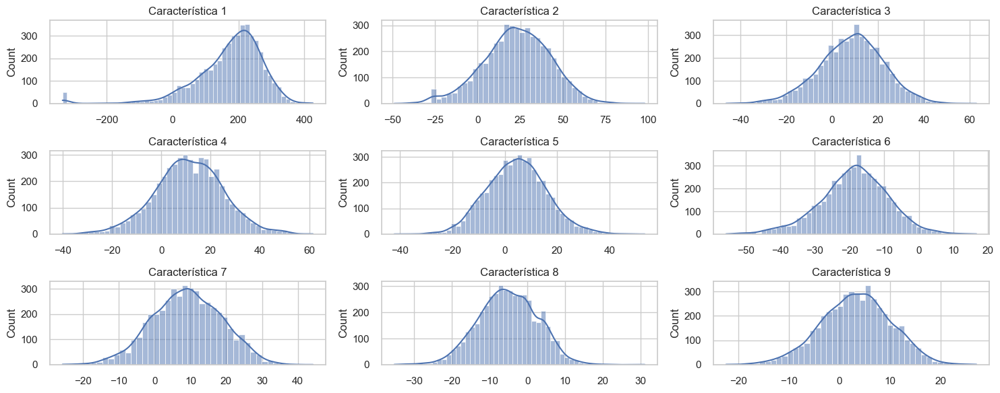


Estadísticas de características:
        Media  Desviación Estándar      Mínimo      Máximo
0  172.047109           105.261887 -334.219421  426.110260
1   22.832967            19.539148  -48.924728   98.039551
2    8.371433            14.079165  -46.256446   62.907964
3   11.265809            13.901121  -40.055259   61.496327
4    4.484250            11.409406  -42.165154   53.349364

Generando visualizaciones...


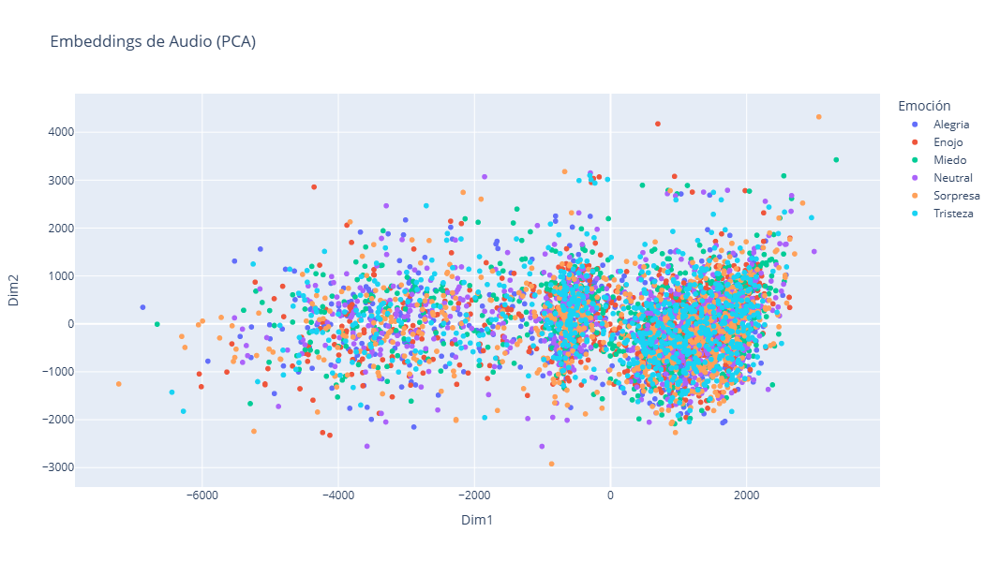

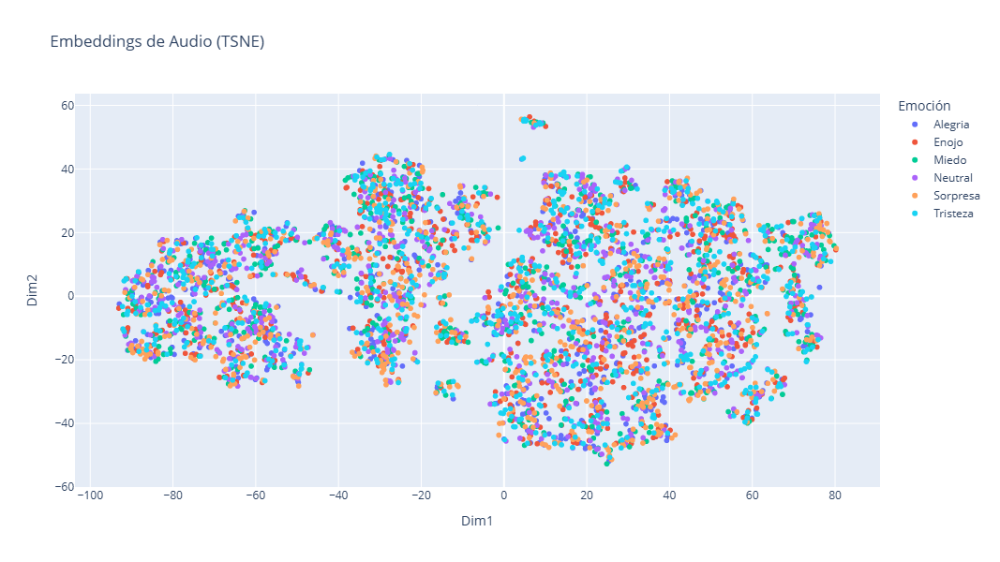


Evaluando con modelo de prueba...
Epoch 1/50
108/117 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1731 - loss: 2.5176
Epoch 1: val_loss improved from inf to 1.83713, saving model to mejor_modelo_emociones.h5


117/117 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.1739 - loss: 2.5003 - val_accuracy: 0.2097 - val_loss: 1.8371 - learning_rate: 0.0010
Epoch 2/50
102/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1995 - loss: 1.9994
Epoch 2: val_loss improved from 1.83713 to 1.77696, saving model to mejor_modelo_emociones.h5


117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.1998 - loss: 1.9965 - val_accuracy: 0.2280 - val_loss: 1.7770 - learning_rate: 0.0010
Epoch 3/50
107/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2002 - loss: 1.9386
Epoch 3: val_loss improved from 1.77696 to 1.74593, saving model to mejor_modelo_emociones.h5


117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2008 - loss: 1.9371 - val_accuracy: 0.2355 - val_loss: 1.7459 - learning_rate: 0.0010
Epoch 4/50
101/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2213 - loss: 1.8297
Epoch 4: val_loss improved from 1.74593 to 1.72371, saving model to mejor_modelo_emociones.h5


117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2217 - loss: 1.8304 - val_accuracy: 0.2323 - val_loss: 1.7237 - learning_rate: 0.0010
Epoch 5/50
 98/117 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2603 - loss: 1.7719
Epoch 5: val_loss improved from 1.72371 to 1.71655, saving model to mejor_modelo_emociones.h5


117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2563 - loss: 1.7744 - val_accuracy: 0.2538 - val_loss: 1.7165 - learning_rate: 0.0010
Epoch 6/50
104/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2443 - loss: 1.7826
Epoch 6: val_loss improved from 1.71655 to 1.69250, saving model to mejor_modelo_emociones.h5


117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.2446 - loss: 1.7807 - val_accuracy: 0.2699 - val_loss: 1.6925 - learning_rate: 0.0010
Epoch 7/50
 93/117 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2520 - loss: 1.7542
Epoch 7: val_loss did not improve from 1.69250
117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2515 - loss: 1.7552 - val_accuracy: 0.2796 - val_loss: 1.6961 - learning_rate: 0.0010
Epoch 8/50
107/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2625 - loss: 1.7247
Epoch 8: val_loss improved from 1.69250 to 1.66707, saving model to mejor_modelo_emociones.h5


117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.2622 - loss: 1.7240 - val_accuracy: 0.2925 - val_loss: 1.6671 - learning_rate: 0.0010
Epoch 9/50
111/117 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2723 - loss: 1.6910
Epoch 9: val_loss did not improve from 1.66707
117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2722 - loss: 1.6913 - val_accuracy: 0.2742 - val_loss: 1.6673 - learning_rate: 0.0010
Epoch 10/50
116/117 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2817 - loss: 1.6692
Epoch 10: val_loss improved from 1.66707 to 1.64338, saving model to mejor_modelo_emociones.h5


117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2816 - loss: 1.6694 - val_accuracy: 0.2763 - val_loss: 1.6434 - learning_rate: 0.0010
Epoch 11/50
101/117 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2739 - loss: 1.6837
Epoch 11: val_loss improved from 1.64338 to 1.64077, saving model to mejor_modelo_emociones.h5


117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2753 - loss: 1.6831 - val_accuracy: 0.2688 - val_loss: 1.6408 - learning_rate: 0.0010
Epoch 12/50
 96/117 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2840 - loss: 1.6523
Epoch 12: val_loss improved from 1.64077 to 1.63713, saving model to mejor_modelo_emociones.h5


117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2858 - loss: 1.6521 - val_accuracy: 0.2989 - val_loss: 1.6371 - learning_rate: 0.0010
Epoch 13/50
111/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3077 - loss: 1.6288
Epoch 13: val_loss improved from 1.63713 to 1.61420, saving model to mejor_modelo_emociones.h5


117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.3076 - loss: 1.6292 - val_accuracy: 0.3054 - val_loss: 1.6142 - learning_rate: 0.0010
Epoch 14/50
 99/117 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3164 - loss: 1.6098
Epoch 14: val_loss improved from 1.61420 to 1.60359, saving model to mejor_modelo_emociones.h5


117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3166 - loss: 1.6114 - val_accuracy: 0.2882 - val_loss: 1.6036 - learning_rate: 0.0010
Epoch 15/50
100/117 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3454 - loss: 1.6055
Epoch 15: val_loss improved from 1.60359 to 1.58934, saving model to mejor_modelo_emociones.h5


117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3445 - loss: 1.6054 - val_accuracy: 0.3183 - val_loss: 1.5893 - learning_rate: 0.0010
Epoch 16/50
112/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3237 - loss: 1.6076
Epoch 16: val_loss did not improve from 1.58934
117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.3239 - loss: 1.6074 - val_accuracy: 0.3194 - val_loss: 1.6039 - learning_rate: 0.0010
Epoch 17/50
109/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3545 - loss: 1.5675
Epoch 17: val_loss did not improve from 1.58934
117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.3531 - loss: 1.5690 - val_accuracy: 0.3097 - val_loss: 1.5994 - learning_rate: 0.0010
Epoch 18/50
100/117 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3479 - loss: 1.5689
Epoch 18: val_loss improved from 1.58934 to 1.57240, saving model to mejor_modelo_emociones.h5


117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3465 - loss: 1.5706 - val_accuracy: 0.3140 - val_loss: 1.5724 - learning_rate: 0.0010
Epoch 19/50
117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3648 - loss: 1.5443
Epoch 19: val_loss did not improve from 1.57240
117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3647 - loss: 1.5445 - val_accuracy: 0.3301 - val_loss: 1.5812 - learning_rate: 0.0010
Epoch 20/50
100/117 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3572 - loss: 1.5443
Epoch 20: val_loss improved from 1.57240 to 1.56640, saving model to mejor_modelo_emociones.h5


117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3579 - loss: 1.5451 - val_accuracy: 0.3484 - val_loss: 1.5664 - learning_rate: 0.0010
Epoch 21/50
101/117 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3587 - loss: 1.5520
Epoch 21: val_loss did not improve from 1.56640
117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3593 - loss: 1.5520 - val_accuracy: 0.3269 - val_loss: 1.5781 - learning_rate: 0.0010
Epoch 22/50
 95/117 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3763 - loss: 1.5053
Epoch 22: val_loss did not improve from 1.56640
117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3752 - loss: 1.5101 - val_accuracy: 0.3398 - val_loss: 1.5726 - learning_rate: 0.0010
Epoch 23/50
117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3603 - loss: 1.5447
Epoch 23: val_loss improved from 1.56640 to 1.55422, saving model to mejor_modelo_emociones.h5


117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3603 - loss: 1.5447 - val_accuracy: 0.3366 - val_loss: 1.5542 - learning_rate: 0.0010
Epoch 24/50
 99/117 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3767 - loss: 1.5140
Epoch 24: val_loss improved from 1.55422 to 1.54687, saving model to mejor_modelo_emociones.h5


117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3769 - loss: 1.5158 - val_accuracy: 0.3656 - val_loss: 1.5469 - learning_rate: 0.0010
Epoch 25/50
 97/117 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3879 - loss: 1.5047
Epoch 25: val_loss improved from 1.54687 to 1.54116, saving model to mejor_modelo_emociones.h5


117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3887 - loss: 1.5049 - val_accuracy: 0.3570 - val_loss: 1.5412 - learning_rate: 0.0010
Epoch 26/50
116/117 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4049 - loss: 1.4870
Epoch 26: val_loss did not improve from 1.54116
117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4048 - loss: 1.4871 - val_accuracy: 0.3409 - val_loss: 1.5812 - learning_rate: 0.0010
Epoch 27/50
 97/117 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3996 - loss: 1.4809
Epoch 27: val_loss did not improve from 1.54116
117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3980 - loss: 1.4824 - val_accuracy: 0.3527 - val_loss: 1.5477 - learning_rate: 0.0010
Epoch 28/50
 98/117 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4026 - loss: 1.4698
Epoch 28: val_loss did not improve from 1.54116
117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4016 - loss: 1.4728 - val_accuracy: 0.3581 - val_loss: 1.5513 - learning_rate: 0.0010
Epoch 29/50
 98/117 ━━━━━━━━━━━

117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4006 - loss: 1.4638 - val_accuracy: 0.3538 - val_loss: 1.5320 - learning_rate: 0.0010
Epoch 30/50
 98/117 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4153 - loss: 1.4375
Epoch 30: val_loss improved from 1.53200 to 1.53158, saving model to mejor_modelo_emociones.h5


117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4157 - loss: 1.4415 - val_accuracy: 0.3731 - val_loss: 1.5316 - learning_rate: 0.0010
Epoch 31/50
 98/117 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3959 - loss: 1.4685
Epoch 31: val_loss did not improve from 1.53158
117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3957 - loss: 1.4692 - val_accuracy: 0.3796 - val_loss: 1.5401 - learning_rate: 0.0010
Epoch 32/50
112/117 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4079 - loss: 1.4600
Epoch 32: val_loss did not improve from 1.53158
117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4086 - loss: 1.4596 - val_accuracy: 0.3613 - val_loss: 1.5675 - learning_rate: 0.0010
Epoch 33/50
 94/117 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4142 - loss: 1.4378
Epoch 33: val_loss did not improve from 1.53158
117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4143 - loss: 1.4401 - val_accuracy: 0.3613 - val_loss: 1.5334 - learning_rate: 0.0010
Epoch 34/50
 98/117 ━━━━━━━━━━━

117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4181 - loss: 1.4635 - val_accuracy: 0.3806 - val_loss: 1.5045 - learning_rate: 0.0010
Epoch 36/50
107/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4133 - loss: 1.4322
Epoch 36: val_loss did not improve from 1.50453
117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4133 - loss: 1.4334 - val_accuracy: 0.3903 - val_loss: 1.5191 - learning_rate: 0.0010
Epoch 37/50
 93/117 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4249 - loss: 1.4122
Epoch 37: val_loss did not improve from 1.50453
117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4228 - loss: 1.4167 - val_accuracy: 0.3817 - val_loss: 1.5067 - learning_rate: 0.0010
Epoch 38/50
 97/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4308 - loss: 1.4377
Epoch 38: val_loss did not improve from 1.50453
117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4317 - loss: 1.4354 - val_accuracy: 0.3591 - val_loss: 1.5153 - learning_rate: 0.0010
Epoch 39/50
 99/117 ━━━━━━━━━━━

117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4313 - loss: 1.4211 - val_accuracy: 0.3925 - val_loss: 1.4835 - learning_rate: 0.0010
Epoch 40/50
111/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4373 - loss: 1.4048
Epoch 40: val_loss did not improve from 1.48353
117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4381 - loss: 1.4048 - val_accuracy: 0.3903 - val_loss: 1.5041 - learning_rate: 0.0010
Epoch 41/50
103/117 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4442 - loss: 1.3789
Epoch 41: val_loss did not improve from 1.48353
117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4431 - loss: 1.3823 - val_accuracy: 0.3634 - val_loss: 1.5474 - learning_rate: 0.0010
Epoch 42/50
103/117 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4443 - loss: 1.3858
Epoch 42: val_loss did not improve from 1.48353
117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4441 - loss: 1.3878 - val_accuracy: 0.3925 - val_loss: 1.4918 - learning_rate: 0.0010
Epoch 43/50
106/117 ━━━━━━━━━━━

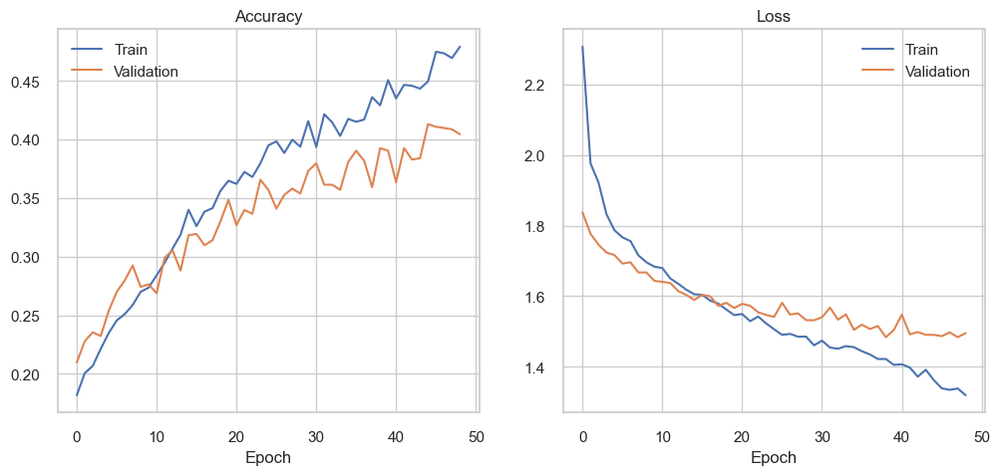


Generando reporte completo...


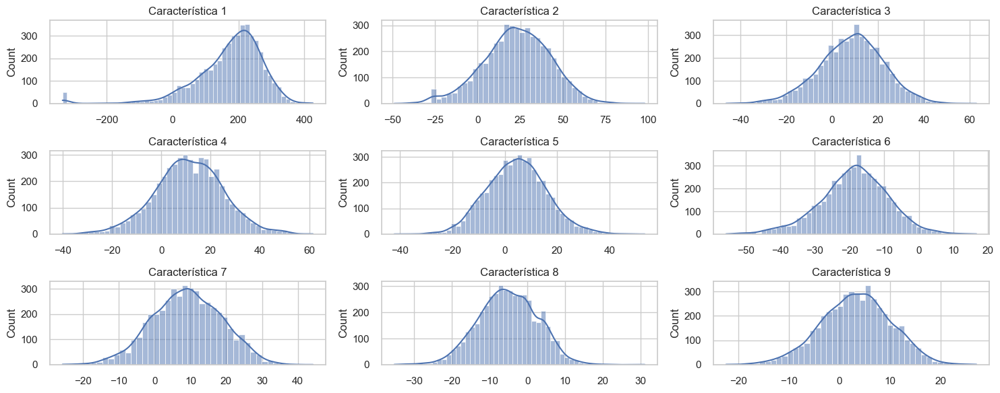

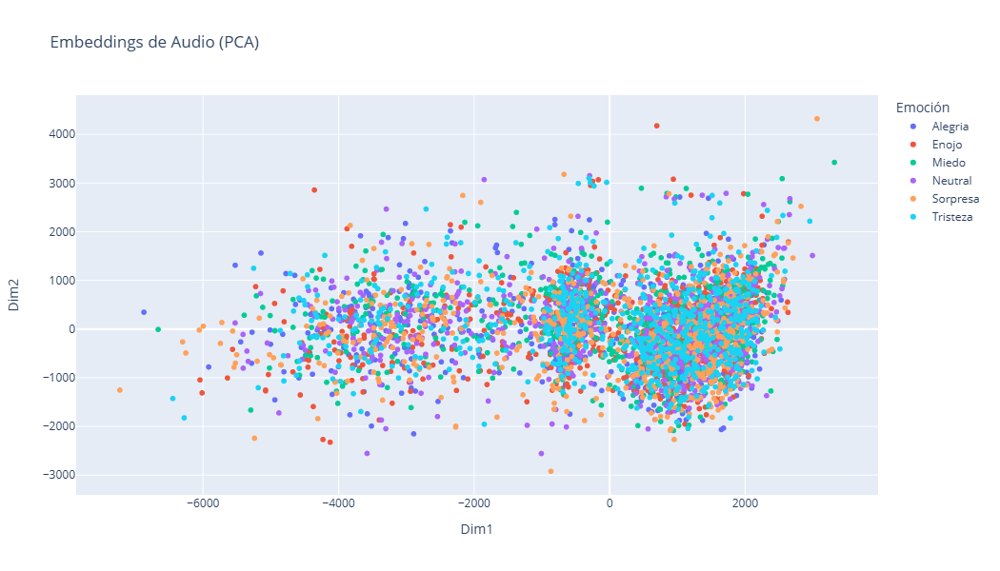

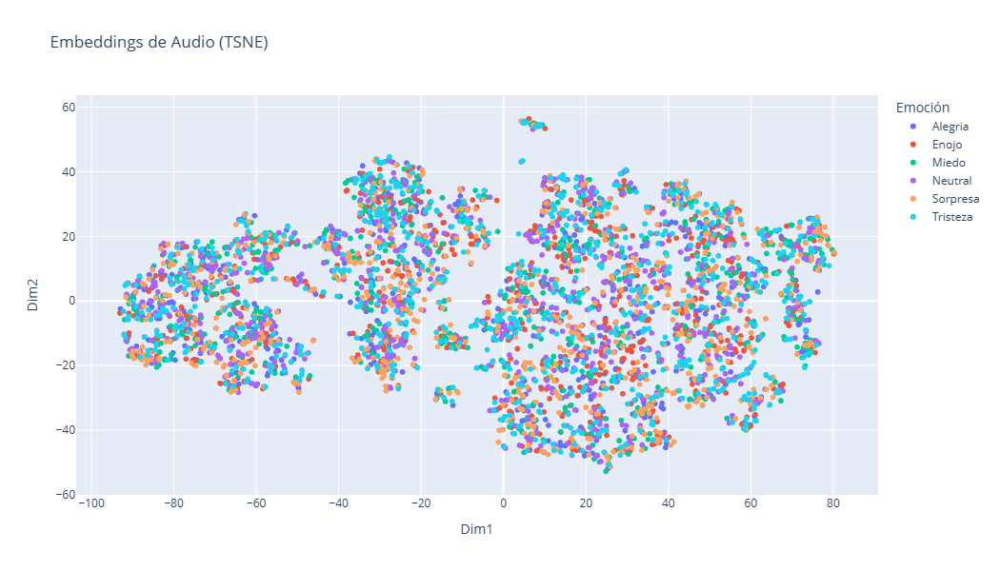

Epoch 1/50
115/117 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1745 - loss: 2.5372
Epoch 1: val_loss improved from inf to 1.85437, saving model to mejor_modelo_emociones.h5


117/117 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.1746 - loss: 2.5320 - val_accuracy: 0.2312 - val_loss: 1.8544 - learning_rate: 0.0010
Epoch 2/50
 93/117 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1966 - loss: 2.0163
Epoch 2: val_loss improved from 1.85437 to 1.80515, saving model to mejor_modelo_emociones.h5


117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1956 - loss: 2.0165 - val_accuracy: 0.2226 - val_loss: 1.8052 - learning_rate: 0.0010
Epoch 3/50
 98/117 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2115 - loss: 1.9243
Epoch 3: val_loss improved from 1.80515 to 1.76549, saving model to mejor_modelo_emociones.h5


117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2114 - loss: 1.9198 - val_accuracy: 0.2452 - val_loss: 1.7655 - learning_rate: 0.0010
Epoch 4/50
116/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2108 - loss: 1.8550
Epoch 4: val_loss improved from 1.76549 to 1.73286, saving model to mejor_modelo_emociones.h5


117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.2110 - loss: 1.8547 - val_accuracy: 0.2462 - val_loss: 1.7329 - learning_rate: 0.0010
Epoch 5/50
112/117 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2279 - loss: 1.8088
Epoch 5: val_loss improved from 1.73286 to 1.71731, saving model to mejor_modelo_emociones.h5


117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2277 - loss: 1.8088 - val_accuracy: 0.2516 - val_loss: 1.7173 - learning_rate: 0.0010
Epoch 6/50
103/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2270 - loss: 1.7683
Epoch 6: val_loss improved from 1.71731 to 1.69231, saving model to mejor_modelo_emociones.h5


117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2279 - loss: 1.7683 - val_accuracy: 0.2462 - val_loss: 1.6923 - learning_rate: 0.0010
Epoch 7/50
108/117 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2711 - loss: 1.7302
Epoch 7: val_loss did not improve from 1.69231
117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2704 - loss: 1.7304 - val_accuracy: 0.2602 - val_loss: 1.6940 - learning_rate: 0.0010
Epoch 8/50
 98/117 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2531 - loss: 1.7252
Epoch 8: val_loss improved from 1.69231 to 1.69202, saving model to mejor_modelo_emociones.h5


117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2533 - loss: 1.7251 - val_accuracy: 0.2677 - val_loss: 1.6920 - learning_rate: 0.0010
Epoch 9/50
 99/117 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2633 - loss: 1.6987
Epoch 9: val_loss improved from 1.69202 to 1.67420, saving model to mejor_modelo_emociones.h5


117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2635 - loss: 1.6992 - val_accuracy: 0.2634 - val_loss: 1.6742 - learning_rate: 0.0010
Epoch 10/50
 99/117 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2758 - loss: 1.7058
Epoch 10: val_loss improved from 1.67420 to 1.65656, saving model to mejor_modelo_emociones.h5


117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2765 - loss: 1.7047 - val_accuracy: 0.2817 - val_loss: 1.6566 - learning_rate: 0.0010
Epoch 11/50
 99/117 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2894 - loss: 1.6619
Epoch 11: val_loss improved from 1.65656 to 1.64970, saving model to mejor_modelo_emociones.h5


117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2881 - loss: 1.6635 - val_accuracy: 0.2527 - val_loss: 1.6497 - learning_rate: 0.0010
Epoch 12/50
113/117 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3055 - loss: 1.6521
Epoch 12: val_loss improved from 1.64970 to 1.61689, saving model to mejor_modelo_emociones.h5


117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3053 - loss: 1.6519 - val_accuracy: 0.2892 - val_loss: 1.6169 - learning_rate: 0.0010
Epoch 13/50
 97/117 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3109 - loss: 1.6302
Epoch 13: val_loss improved from 1.61689 to 1.61538, saving model to mejor_modelo_emociones.h5


117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3104 - loss: 1.6316 - val_accuracy: 0.3086 - val_loss: 1.6154 - learning_rate: 0.0010
Epoch 14/50
100/117 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3182 - loss: 1.6382
Epoch 14: val_loss improved from 1.61538 to 1.60870, saving model to mejor_modelo_emociones.h5


117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3194 - loss: 1.6347 - val_accuracy: 0.3000 - val_loss: 1.6087 - learning_rate: 0.0010
Epoch 15/50
 96/117 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3317 - loss: 1.5986
Epoch 15: val_loss did not improve from 1.60870
117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3316 - loss: 1.5994 - val_accuracy: 0.2914 - val_loss: 1.6108 - learning_rate: 0.0010
Epoch 16/50
100/117 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3214 - loss: 1.6198
Epoch 16: val_loss improved from 1.60870 to 1.59137, saving model to mejor_modelo_emociones.h5


117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3223 - loss: 1.6181 - val_accuracy: 0.3161 - val_loss: 1.5914 - learning_rate: 0.0010
Epoch 17/50
 97/117 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3385 - loss: 1.5777
Epoch 17: val_loss did not improve from 1.59137
117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3393 - loss: 1.5790 - val_accuracy: 0.3194 - val_loss: 1.6005 - learning_rate: 0.0010
Epoch 18/50
 97/117 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3324 - loss: 1.5919
Epoch 18: val_loss did not improve from 1.59137
117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3335 - loss: 1.5908 - val_accuracy: 0.3312 - val_loss: 1.6102 - learning_rate: 0.0010
Epoch 19/50
100/117 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3470 - loss: 1.5629
Epoch 19: val_loss improved from 1.59137 to 1.58877, saving model to mejor_modelo_emociones.h5


117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3491 - loss: 1.5618 - val_accuracy: 0.3140 - val_loss: 1.5888 - learning_rate: 0.0010
Epoch 20/50
 99/117 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3668 - loss: 1.5426
Epoch 20: val_loss improved from 1.58877 to 1.57555, saving model to mejor_modelo_emociones.h5


117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3649 - loss: 1.5453 - val_accuracy: 0.3280 - val_loss: 1.5756 - learning_rate: 0.0010
Epoch 21/50
 96/117 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3731 - loss: 1.5292
Epoch 21: val_loss did not improve from 1.57555
117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3709 - loss: 1.5322 - val_accuracy: 0.3151 - val_loss: 1.5852 - learning_rate: 0.0010
Epoch 22/50
100/117 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3701 - loss: 1.5378
Epoch 22: val_loss did not improve from 1.57555
117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3695 - loss: 1.5395 - val_accuracy: 0.3333 - val_loss: 1.5803 - learning_rate: 0.0010
Epoch 23/50
113/117 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3667 - loss: 1.5455
Epoch 23: val_loss improved from 1.57555 to 1.55071, saving model to mejor_modelo_emociones.h5


117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.3665 - loss: 1.5453 - val_accuracy: 0.3473 - val_loss: 1.5507 - learning_rate: 0.0010
Epoch 24/50
 98/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3837 - loss: 1.5127
Epoch 24: val_loss did not improve from 1.55071
117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.3816 - loss: 1.5152 - val_accuracy: 0.3516 - val_loss: 1.5922 - learning_rate: 0.0010
Epoch 25/50
 98/117 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3617 - loss: 1.5317
Epoch 25: val_loss did not improve from 1.55071
117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3636 - loss: 1.5303 - val_accuracy: 0.3043 - val_loss: 1.6514 - learning_rate: 0.0010
Epoch 26/50
116/117 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3647 - loss: 1.5150
Epoch 26: val_loss did not improve from 1.55071
117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3647 - loss: 1.5151 - val_accuracy: 0.3441 - val_loss: 1.5864 - learning_rate: 0.0010
Epoch 27/50
116/117 ━━━━━━━━━━━

117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4487 - loss: 1.4023 - val_accuracy: 0.3731 - val_loss: 1.5429 - learning_rate: 5.0000e-04
Epoch 34/50
103/117 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4304 - loss: 1.3945
Epoch 34: val_loss improved from 1.54289 to 1.53909, saving model to mejor_modelo_emociones.h5


117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4315 - loss: 1.3955 - val_accuracy: 0.3935 - val_loss: 1.5391 - learning_rate: 5.0000e-04
Epoch 35/50
111/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4423 - loss: 1.4196
Epoch 35: val_loss improved from 1.53909 to 1.53426, saving model to mejor_modelo_emociones.h5


117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.4423 - loss: 1.4190 - val_accuracy: 0.3892 - val_loss: 1.5343 - learning_rate: 5.0000e-04
Epoch 36/50
100/117 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4138 - loss: 1.4345
Epoch 36: val_loss did not improve from 1.53426
117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4157 - loss: 1.4303 - val_accuracy: 0.3892 - val_loss: 1.5474 - learning_rate: 5.0000e-04
Epoch 37/50
117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4334 - loss: 1.3964
Epoch 37: val_loss did not improve from 1.53426
117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4335 - loss: 1.3964 - val_accuracy: 0.3817 - val_loss: 1.5519 - learning_rate: 5.0000e-04
Epoch 38/50
108/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4460 - loss: 1.3898
Epoch 38: val_loss improved from 1.53426 to 1.52522, saving model to mejor_modelo_emociones.h5


117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4467 - loss: 1.3899 - val_accuracy: 0.3806 - val_loss: 1.5252 - learning_rate: 5.0000e-04
Epoch 39/50
117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4593 - loss: 1.3739
Epoch 39: val_loss did not improve from 1.52522
117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4591 - loss: 1.3741 - val_accuracy: 0.3903 - val_loss: 1.5428 - learning_rate: 5.0000e-04
Epoch 40/50
107/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4533 - loss: 1.3864
Epoch 40: val_loss improved from 1.52522 to 1.51784, saving model to mejor_modelo_emociones.h5


117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4529 - loss: 1.3856 - val_accuracy: 0.3914 - val_loss: 1.5178 - learning_rate: 5.0000e-04
Epoch 41/50
111/117 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4507 - loss: 1.3808
Epoch 41: val_loss did not improve from 1.51784
117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4511 - loss: 1.3805 - val_accuracy: 0.3849 - val_loss: 1.5362 - learning_rate: 5.0000e-04
Epoch 42/50
111/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4525 - loss: 1.3649
Epoch 42: val_loss did not improve from 1.51784
117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4518 - loss: 1.3656 - val_accuracy: 0.3957 - val_loss: 1.5421 - learning_rate: 5.0000e-04
Epoch 43/50
 97/117 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4685 - loss: 1.3309
Epoch 43: val_loss did not improve from 1.51784
117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4669 - loss: 1.3360 - val_accuracy: 0.3849 - val_loss: 1.5601 - learning_rate: 5.0000e-04
Epoch 44/50
 98

<Figure size 800x550 with 0 Axes>

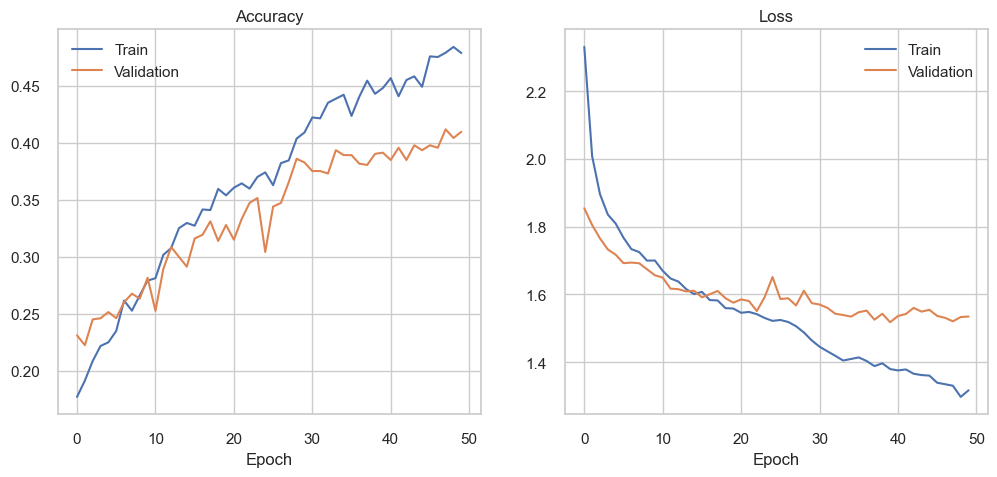


Reporte guardado en: Evaluation_Results

=== Evaluación completada ===


In [30]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from tensorflow.keras.utils import to_categorical
import joblib
import plotly.express as px
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.initializers import HeNormal
import datetime


class DatasetEvaluator:
    def __init__(self, dataset_path):
        self.dataset_path = dataset_path
        self.X = None
        self.y = None
        self.label_encoder = LabelEncoder()
        self.scaler = None
        
    def load_dataset(self):
        """Carga el dataset optimizado y las etiquetas"""
        X = []
        y = []
        
        # Cargar el scaler si existe
        scaler_path = os.path.join(self.dataset_path, 'scaler.pkl')
        if os.path.exists(scaler_path):
            self.scaler = joblib.load(scaler_path)
        
        # Recorrer estructura de directorios
        for emotion in os.listdir(self.dataset_path):
            emotion_path = os.path.join(self.dataset_path, emotion)
            if not os.path.isdir(emotion_path) or emotion == 'stats':
                continue
                
            for file in os.listdir(emotion_path):
                if file.startswith('opt_') and file.endswith('.npy'):
                    file_path = os.path.join(emotion_path, file)
                    features = np.load(file_path)
                    X.append(features)
                    y.append(emotion)
        
        self.X = np.array(X)
        self.y = self.label_encoder.fit_transform(y)
        
        print(f"\nDataset cargado: {self.X.shape[0]} muestras")
        print(f"Características por muestra: {self.X.shape[1]}")
        print("Distribución de clases:")
        print(pd.Series(self.label_encoder.inverse_transform(self.y)).value_counts())
        
        return self.X, self.y
    
    def analyze_quality(self):
        """Analiza la calidad de las características extraídas"""
        if self.X is None:
            self.load_dataset()
        
        # Estadísticas básicas
        stats = {
            'Media': np.mean(self.X, axis=0),
            'Desviación Estándar': np.std(self.X, axis=0),
            'Mínimo': np.min(self.X, axis=0),
            'Máximo': np.max(self.X, axis=0)
        }
        
        # Visualización de distribuciones
        plt.figure(figsize=(15, 6))
        for i in range(min(9, self.X.shape[1])):
            plt.subplot(3, 3, i+1)
            sns.histplot(self.X[:, i], kde=True)
            plt.title(f'Característica {i+1}')
        plt.tight_layout()
        plt.show()
        
        return pd.DataFrame(stats)
    
    def visualize_embeddings(self, method='tsne', perplexity=30):
        """Visualización de las características en 2D"""
        if self.X is None:
            self.load_dataset()
        
        # Reducción de dimensionalidad
        if method == 'tsne':
            reducer = TSNE(n_components=2, perplexity=perplexity, random_state=42)
            embeddings = reducer.fit_transform(self.X)
        elif method == 'pca':
            reducer = PCA(n_components=2, random_state=42)
            embeddings = reducer.fit_transform(self.X)
        else:
            raise ValueError("Método debe ser 'tsne' o 'pca'")
        
        # DataFrame para visualización
        plot_df = pd.DataFrame({
            'Dim1': embeddings[:, 0],
            'Dim2': embeddings[:, 1],
            'Emoción': self.label_encoder.inverse_transform(self.y)
        })
        
        # Gráfico interactivo
        fig = px.scatter(plot_df, x='Dim1', y='Dim2', color='Emoción',
                         hover_data=['Dim1', 'Dim2'],
                         title=f'Embeddings de Audio ({method.upper()})',
                         width=800, height=600)
        fig.show()
        
        return embeddings
    
    def train_test_model(self, test_size=0.2, epochs=50, batch_size=32):
        """Entrena un modelo simple para evaluación"""
        if self.X is None:
            self.load_dataset()
        
        # Dividir datos
        X_train, X_test, y_train, y_test = train_test_split(
            self.X, self.y, test_size=test_size, stratify=self.y, random_state=42)
        
        # Convertir a one-hot encoding
        y_train_cat = to_categorical(y_train)
        y_test_cat = to_categorical(y_test)
        
        # --- Red neuronal mejorada ---
        model = Sequential([
            Dense(256, activation='relu', kernel_initializer=HeNormal(), input_shape=(X_train.shape[1],)),
            BatchNormalization(),
            Dropout(0.5),
            
            Dense(128, activation='relu', kernel_initializer=HeNormal()),
            BatchNormalization(),
            Dropout(0.3),
            
            Dense(64, activation='relu', kernel_initializer=HeNormal()),
            Dropout(0.2),
            
            Dense(len(self.label_encoder.classes_), activation='softmax')
        ])
        
        model.compile(optimizer='adam',
                      loss='categorical_crossentropy',
                      metrics=['accuracy'])
        
        # --- Callbacks ---
        callbacks = [
            EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True, verbose=1),
            ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-6, verbose=1),
            ModelCheckpoint('mejor_modelo_emociones.h5', monitor='val_loss', save_best_only=True, verbose=1)
        ]
        
        # (Opcional) TensorBoard
        log_dir = "logs/emociones/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
        # from tensorflow.keras.callbacks import TensorBoard
        # callbacks.append(TensorBoard(log_dir=log_dir))
        
        # --- Entrenamiento ---
        history = model.fit(X_train, y_train_cat,
                            epochs=epochs,
                            batch_size=batch_size,
                            validation_data=(X_test, y_test_cat),
                            callbacks=callbacks,
                            verbose=1)
       
        # Evaluación
        y_pred = model.predict(X_test)
        y_pred_classes = np.argmax(y_pred, axis=1)
        
        print("\nReporte de Clasificación:")
        print(classification_report(y_test, y_pred_classes, 
                                  target_names=self.label_encoder.classes_))
        
        # Gráficas de entrenamiento
        plt.figure(figsize=(12, 5))
        plt.subplot(1, 2, 1)
        plt.plot(history.history['accuracy'], label='Train')
        plt.plot(history.history['val_accuracy'], label='Validation')
        plt.title('Accuracy')
        plt.xlabel('Epoch')
        plt.legend()
        
        plt.subplot(1, 2, 2)
        plt.plot(history.history['loss'], label='Train')
        plt.plot(history.history['val_loss'], label='Validation')
        plt.title('Loss')
        plt.xlabel('Epoch')
        plt.legend()
        plt.show()
        
        return model, history

    def save_analysis_report(self, output_dir='analysis_results'):
        
        """Guarda un reporte completo del análisis"""
        if self.X is None:
            self.load_dataset()
        
        os.makedirs(output_dir, exist_ok=True)
        
        # Estadísticas básicas
        stats = self.analyze_quality()
        stats.to_csv(os.path.join(output_dir, 'feature_statistics.csv'))
        
        # Visualizaciones
        self.visualize_embeddings(method='pca')
        plt.savefig(os.path.join(output_dir, 'pca_plot.png'))
        
        self.visualize_embeddings(method='tsne')
        plt.savefig(os.path.join(output_dir, 'tsne_plot.png'))
        
        # Entrenamiento de modelo de evaluación
        model, history = self.train_test_model()
        model.save(os.path.join(output_dir, 'evaluation_model.h5'))
        
        # Reporte de clases
        class_dist = pd.Series(self.label_encoder.inverse_transform(self.y)).value_counts()
        class_dist.to_csv(os.path.join(output_dir, 'class_distribution.csv'))
        
        print(f"\nReporte guardado en: {output_dir}")

# Ejemplo de uso
if __name__ == "__main__":
    # Configuración
    DATASET_PATH = "Dataset_condensado_optimizado"  # Ruta al dataset optimizado
    OUTPUT_DIR = "Evaluation_Results"    # Directorio para guardar reportes
    
    print("=== Iniciando evaluación del dataset optimizado ===")
    
    # 1. Crear evaluador y cargar datos
    evaluator = DatasetEvaluator(DATASET_PATH)
    X, y = evaluator.load_dataset()
    
    # 2. Análisis de calidad
    print("\nAnalizando calidad de características...")
    feature_stats = evaluator.analyze_quality()
    print("\nEstadísticas de características:")
    print(feature_stats.head())  # Mostrar primeras características
    
    # 3. Visualización
    print("\nGenerando visualizaciones...")
    evaluator.visualize_embeddings(method='pca')
    evaluator.visualize_embeddings(method='tsne')
    
    # 4. Evaluación con modelo simple
    print("\nEvaluando con modelo de prueba...")
    evaluator.train_test_model()
    
    # 5. Guardar reporte completo
    print("\nGenerando reporte completo...")
    evaluator.save_analysis_report(OUTPUT_DIR)
    
    print("\n=== Evaluación completada ===")
    

## CÓDIGO COMPLETO CON MFCC + STFT


🔨 Entrenando Random Forest...

🧠 Construyendo red neuronal...
🔨 Entrenando red neuronal mejorada...
Epoch 1/30
116/116 ━━━━━━━━━━━━━━━━━━━━ 50s 400ms/step - accuracy: 0.2021 - loss: 2.1854 - val_accuracy: 0.1690 - val_loss: 2.6185 - learning_rate: 0.0010
Epoch 2/30
116/116 ━━━━━━━━━━━━━━━━━━━━ 51s 440ms/step - accuracy: 0.2406 - loss: 1.8615 - val_accuracy: 0.2210 - val_loss: 1.8335 - learning_rate: 0.0010
Epoch 3/30
116/116 ━━━━━━━━━━━━━━━━━━━━ 53s 452ms/step - accuracy: 0.2974 - loss: 1.7598 - val_accuracy: 0.2069 - val_loss: 2.4613 - learning_rate: 0.0010
Epoch 4/30
116/116 ━━━━━━━━━━━━━━━━━━━━ 52s 452ms/step - accuracy: 0.3047 - loss: 1.6852 - val_accuracy: 0.1690 - val_loss: 5.3678 - learning_rate: 0.0010
Epoch 5/30
116/116 ━━━━━━━━━━━━━━━━━━━━ 53s 460ms/step - accuracy: 0.3172 - loss: 1.6571 - val_accuracy: 0.1993 - val_loss: 3.7377 - learning_rate: 0.0010
Epoch 6/30
116/116 ━━━━━━━━━━━━━━━━━━━━ 52s 448ms/step - accuracy: 0.3495 - loss: 1.6212 - val_accuracy: 0.2102 - val_loss: 

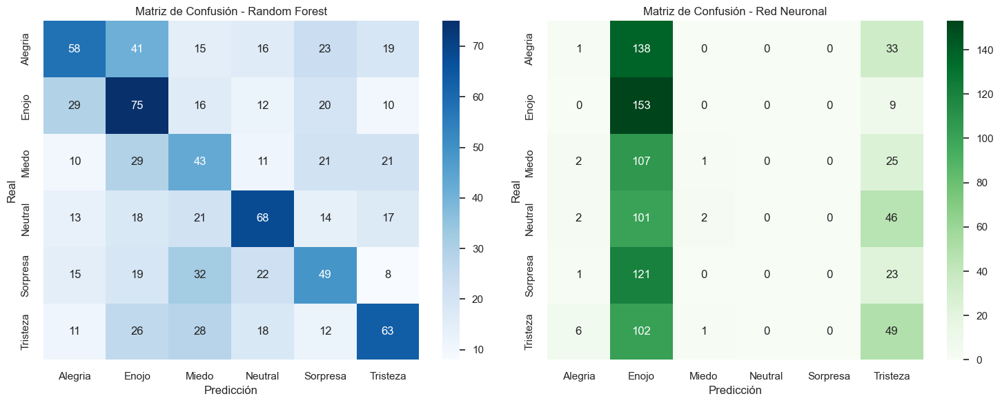

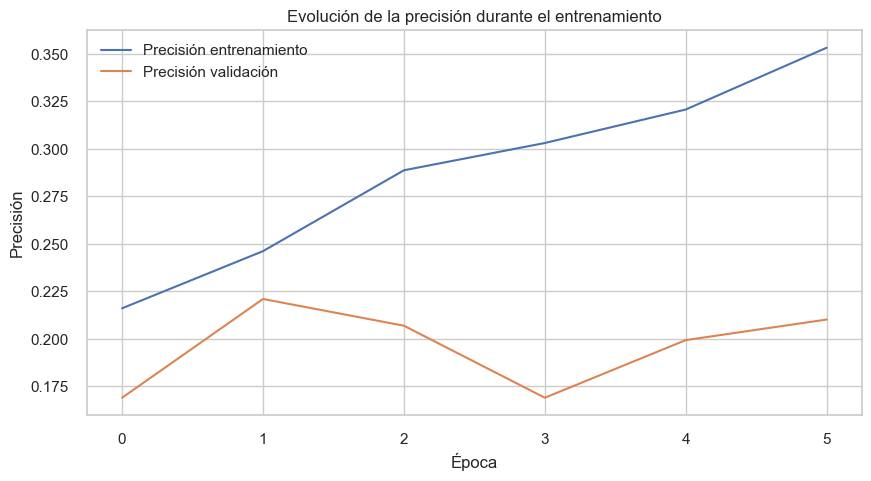

Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_9 (Conv2D)                    │ (None, 128, 128, 32)        │             320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_13               │ (None, 128, 128, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation (Activation)              │ (None, 128, 128, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_9 (MaxPooling2D)       │ (None, 64, 64, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_20 (Dropout)                 │ (None, 64, 64, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_10 (Conv2D)                   │ (None, 64, 64, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_14               │ (None, 64, 64, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_1 (Activation)            │ (None, 64, 64, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_10 (MaxPooling2D)      │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_21 (Dropout)                 │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_11 (Conv2D)                   │ (None, 32, 32, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_15               │ (None, 32, 32, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_2 (Activation)            │ (None, 32, 32, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_11 (MaxPooling2D)      │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_22 (Dropout)                 │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 128)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_17 (Dense)                     │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_16               │ (None, 64)                  │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_3 (Activation)            │ (None, 64)                  │              

 Total params: 306,260 (1.17 MB)

 Trainable params: 101,894 (398.02 KB)

 Non-trainable params: 576 (2.25 KB)

 Optimizer params: 203,790 (796.06 KB)

In [32]:
import os
import numpy as np
import librosa
import librosa.display
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import tensorflow as tf
from tensorflow.keras import layers, models, callbacks
from tensorflow.keras.utils import to_categorical

# ✅ Configuración
DATASET_PATH = "Dataset_comprimido"
EMOTIONS = ['Alegria', 'Enojo', 'Miedo', 'Neutral', 'Sorpresa', 'Tristeza']
SAMPLE_RATE = 16000
N_MFCC = 40
SPEC_SHAPE = (128, 128)  # Tamaño para redimensionar espectrogramas

# ✅ Función para extraer características (MFCC + STFT)
def extract_features(file_path):
    try:
        y, sr = librosa.load(file_path, sr=SAMPLE_RATE)
        
        # MFCC promedio
        mfcc = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=N_MFCC)
        mfcc_mean = np.mean(mfcc, axis=1)

        # STFT -> magnitud -> log -> promedio por frecuencia
        stft = librosa.stft(y, n_fft=512, hop_length=256)
        stft_mag = np.abs(stft)
        stft_db = librosa.amplitude_to_db(stft_mag, ref=np.max)
        stft_mean = np.mean(stft_db, axis=1)

        # Concatenar características
        features = np.concatenate((mfcc_mean, stft_mean))
        return features
    except Exception as e:
        print(f"❌ Error en {file_path}: {e}")
        return None

# ✅ Función para generar espectrogramas (para la CNN)
def create_spectrogram(file_path):
    try:
        y, sr = librosa.load(file_path, sr=SAMPLE_RATE)
        
        # Crear espectrograma MEL
        S = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128)
        S_db = librosa.power_to_db(S, ref=np.max)
        
        # Redimensionar a tamaño fijo
        from skimage.transform import resize
        S_db_resized = resize(S_db, SPEC_SHAPE, anti_aliasing=True)
        
        # Añadir dimensión de canal (para CNN)
        return S_db_resized[..., np.newaxis]
    except Exception as e:
        print(f"❌ Error en espectrograma {file_path}: {e}")
        return None

# ✅ Leer dataset y extraer características
X_features, X_specs, y = [], [], []
for emotion in EMOTIONS:
    folder = os.path.join(DATASET_PATH, emotion)
    if not os.path.isdir(folder):
        continue
    for file in os.listdir(folder):
        if file.endswith(".wav"):
            file_path = os.path.join(folder, file)
            
            # Extraer características para Random Forest
            feats = extract_features(file_path)
            
            # Crear espectrograma para CNN
            spec = create_spectrogram(file_path)
            
            if feats is not None and spec is not None:
                X_features.append(feats)
                X_specs.append(spec)
                y.append(emotion)

# Convertir a arrays numpy
X_features = np.array(X_features)
X_specs = np.array(X_specs)
y_encoded = LabelEncoder().fit_transform(y)
y_categorical = to_categorical(y_encoded)

# ✅ Dividir datos para ambos modelos
X_train_f, X_test_f, X_train_s, X_test_s, y_train, y_test = train_test_split(
    X_features, X_specs, y_encoded, test_size=0.2, random_state=42)

# ✅ 1. Entrenar Random Forest (características tradicionales)
print("\n🔨 Entrenando Random Forest...")
clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(X_train_f, y_train)
y_pred_rf = clf.predict(X_test_f)

# ✅ 2. Construir y entrenar CNN (espectrogramas)
print("\n🧠 Construyendo red neuronal...")

model = models.Sequential([
    layers.Input(shape=(*SPEC_SHAPE, 1)),

    layers.Conv2D(32, (3, 3), padding='same'),
    layers.BatchNormalization(),
    layers.Activation('relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.3),

    layers.Conv2D(64, (3, 3), padding='same'),
    layers.BatchNormalization(),
    layers.Activation('relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.3),

    layers.Conv2D(128, (3, 3), padding='same'),
    layers.BatchNormalization(),
    layers.Activation('relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.4),

    layers.GlobalAveragePooling2D(),
    layers.Dense(64),
    layers.BatchNormalization(),
    layers.Activation('relu'),
    layers.Dropout(0.4),
    layers.Dense(len(EMOTIONS), activation='softmax')
])


model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# --- Callbacks útiles ---
early_stop = callbacks.EarlyStopping(monitor='val_loss', patience=4, restore_best_weights=True)
reduce_lr = callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3)

print("🔨 Entrenando red neuronal mejorada...")
history = model.fit(X_train_s, y_train, 
                    epochs=30, 
                    batch_size=32,
                    validation_data=(X_test_s, y_test),
                    callbacks=[early_stop, reduce_lr])

# ✅ Evaluar ambos modelos
print("\n📊 Evaluación de modelos:")

# 1. Resultados Random Forest
print("\n🔹 Random Forest:")
print(classification_report(y_test, y_pred_rf, target_names=EMOTIONS))

# 2. Resultados CNN
y_pred_cnn = model.predict(X_test_s).argmax(axis=1)
print("\n🔹 Red Neuronal Convolucional:")
print(classification_report(y_test, y_pred_cnn, target_names=EMOTIONS))

# ✅ Matrices de confusión
plt.figure(figsize=(15, 6))

# Matriz para Random Forest
plt.subplot(1, 2, 1)
cm_rf = confusion_matrix(y_test, y_pred_rf)
sns.heatmap(cm_rf, annot=True, fmt='d', cmap='Blues', xticklabels=EMOTIONS, yticklabels=EMOTIONS)
plt.title("Matriz de Confusión - Random Forest")
plt.xlabel("Predicción")
plt.ylabel("Real")

# Matriz para CNN
plt.subplot(1, 2, 2)
cm_cnn = confusion_matrix(y_test, y_pred_cnn)
sns.heatmap(cm_cnn, annot=True, fmt='d', cmap='Greens', xticklabels=EMOTIONS, yticklabels=EMOTIONS)
plt.title("Matriz de Confusión - Red Neuronal")
plt.xlabel("Predicción")
plt.ylabel("Real")

plt.tight_layout()
plt.show()

# ✅ Gráfico de precisión de entrenamiento de la CNN
plt.figure(figsize=(10, 5))
plt.plot(history.history['accuracy'], label='Precisión entrenamiento')
plt.plot(history.history['val_accuracy'], label='Precisión validación')
plt.title('Evolución de la precisión durante el entrenamiento')
plt.ylabel('Precisión')
plt.xlabel('Época')
plt.legend()
plt.show()

# ✅ Mostrar arquitectura de la red neuronal
model.summary()


## Código Modificado con Análisis de Sub-Bandas (SBC) sin Wavelets

--- Reporte de Clasificación (con SBC) ---
              precision    recall  f1-score   support

     Alegria       0.42      0.36      0.39       173
       Enojo       0.46      0.35      0.39       170
       Miedo       0.32      0.36      0.34       140
     Neutral       0.43      0.52      0.47       145
    Sorpresa       0.41      0.43      0.42       148
    Tristeza       0.37      0.40      0.38       154

    accuracy                           0.40       930
   macro avg       0.40      0.40      0.40       930
weighted avg       0.41      0.40      0.40       930



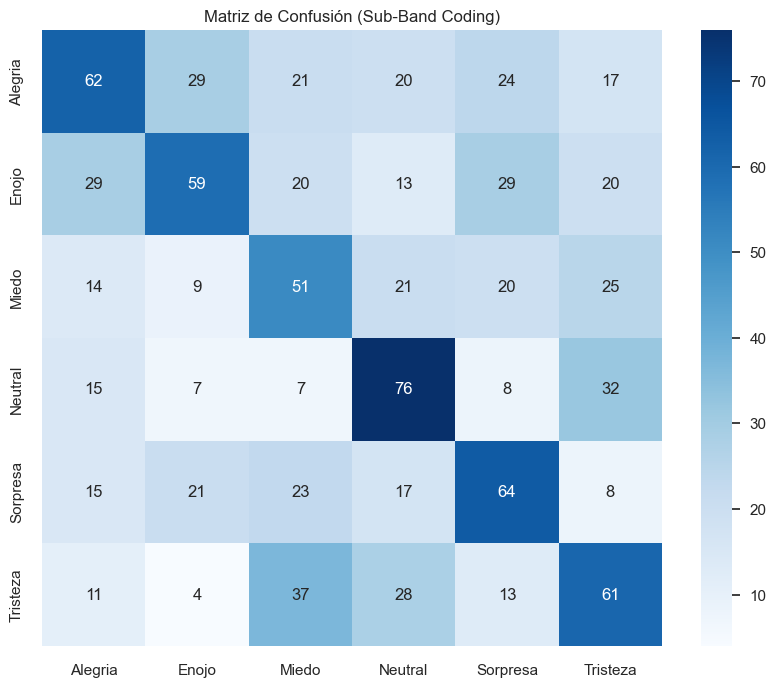

In [34]:
import os
import librosa
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Configuración
DATASET_PATH = "Dataset_comprimido"  
EMOTIONS = ['Alegria', 'Enojo', 'Miedo', 'Neutral', 'Sorpresa', 'Tristeza']
SAMPLE_RATE = 22050
DURATION = 3  # segundos
N_MFCC = 40 #13

# Definición de sub-bandas (ejemplo: 4 bandas)
SUB_BANDS = {
    'low': (0, 500),     # Banda baja (0-500 Hz)
    'mid-low': (500, 1000), 
    'mid-high': (1000, 4000), 
    'high': (4000, SAMPLE_RATE//2)  # Banda alta (>4kHz)
}

# Función para extraer características de una sub-banda
def extract_subband_features(audio, sr, low_freq, high_freq):
    # Filtrado espectral (simulado con STFT)
    stft = librosa.stft(audio)
    freq = librosa.fft_frequencies(sr=sr)
    band_mask = np.logical_and(freq >= low_freq, freq <= high_freq)
    stft_band = stft[band_mask, :]
    
    # Reconstruir la señal de la sub-banda (opcional)
    audio_band = librosa.istft(stft_band)
    
    # Extraer características de la sub-banda
    mfccs = librosa.feature.mfcc(y=audio_band, sr=sr, n_mfcc=N_MFCC)
    mfccs_mean = np.mean(mfccs.T, axis=0)
    
    spectral_centroid = np.mean(librosa.feature.spectral_centroid(y=audio_band, sr=sr))
    energy = np.sum(audio_band**2) / len(audio_band)
    
    return np.hstack([mfccs_mean, spectral_centroid, energy])

# Función principal para extraer características con SBC
def extract_features_with_sbc(file_path):
    try:
        audio, sr = librosa.load(file_path, sr=SAMPLE_RATE, duration=DURATION)
        if len(audio) < SAMPLE_RATE * DURATION:
            audio = np.pad(audio, (0, SAMPLE_RATE * DURATION - len(audio)), 'constant')
        
        features = []
        for band, (low_freq, high_freq) in SUB_BANDS.items():
            band_features = extract_subband_features(audio, sr, low_freq, high_freq)
            features.extend(band_features)
        
        return np.array(features)
    except Exception as e:
        print(f"Error en {file_path}: {e}")
        return None

# Cargar dataset y extraer características con SBC
def load_dataset_with_sbc(dataset_path):
    features_list = []
    labels_list = []
    
    for emotion in EMOTIONS:
        emotion_path = os.path.join(dataset_path, emotion)
        for audio_file in os.listdir(emotion_path):
            file_path = os.path.join(emotion_path, audio_file)
            features = extract_features_with_sbc(file_path)
            if features is not None:
                features_list.append(features)
                labels_list.append(emotion)
    
    return np.array(features_list), np.array(labels_list)

# Cargar datos
X, y = load_dataset_with_sbc(DATASET_PATH)

# Codificar etiquetas
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Dividir y estandarizar
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Entrenar y evaluar
model = SVC(kernel='rbf', C=1.0, gamma='scale', random_state=42)
model.fit(X_train_scaled, y_train)
y_pred = model.predict(X_test_scaled)

print("--- Reporte de Clasificación (con SBC) ---")
print(classification_report(y_test, y_pred, target_names=EMOTIONS))

# Matriz de confusión
plt.figure(figsize=(10, 8))
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt='d', cmap='Blues',
            xticklabels=EMOTIONS, yticklabels=EMOTIONS)
plt.title("Matriz de Confusión (Sub-Band Coding)")
plt.show()


## Visualización de datos y parámetros

### 1. Instalación de dependencias

In [14]:
#!pip install librosa pandas matplotlib seaborn scikit-learn xgboost tensorflow tqdm ipywidgets
#!pip install ipython

### 2. Configuración inicial

In [49]:
import os
import numpy as np
import pandas as pd
import librosa
import librosa.display
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from ipywidgets import interact, Dropdown
import IPython.display as ipd

# Configuración de visualización
plt.style.use('seaborn-v0_8')
sns.set(style="whitegrid", font_scale=1.2)
pd.set_option('display.max_columns', 50)

### 3. Función para extraer características con análisis por emoción

In [51]:
def extract_emotion_features(file_path, sr=22050, duration=4):
    """Extrae características acústicas con énfasis en patrones emocionales"""
    try:
        audio, sr = librosa.load(file_path, sr=sr, duration=duration)
        
        if len(audio) < sr * duration:
            audio = np.pad(audio, (0, max(0, sr * duration - len(audio))), 'constant')
        
        features = {}
        
        # 1. Características básicas por emoción
        features['zcr'] = np.mean(librosa.feature.zero_crossing_rate(y=audio))
        features['rms'] = np.mean(librosa.feature.rms(y=audio))
        
        # 2. Análisis espectral por bandas emocionales
        freqs = librosa.fft_frequencies(sr=sr)
        spectrum = np.abs(librosa.stft(audio))
        
        # Bandas emocionales clave
        emotion_bands = {
            'bass': (60, 250),       # Tristeza
            'low_mid': (250, 500),   # Neutral
            'mid': (500, 2000),      # Alegría
            'upper_mid': (2000, 4000), # Enojo
            'high': (4000, 8000)     # Miedo/Sorpresa
        }
        
        for band, (low, high) in emotion_bands.items():
            band_mask = (freqs >= low) & (freqs < high)
            features[f'{band}_energy'] = np.log1p(np.sum(spectrum[band_mask, :]))
        
        # 3. Características específicas por emoción
        pitch = librosa.yin(audio, fmin=50, fmax=500, sr=sr)
        pitch = pitch[pitch > 0]  # Filtrar valores inválidos
        
        features.update({
            'pitch_mean': np.mean(pitch) if len(pitch) > 0 else 0,
            'pitch_std': np.std(pitch) if len(pitch) > 0 else 0,
            'spectral_centroid': np.mean(librosa.feature.spectral_centroid(y=audio, sr=sr)),
            'harmonic_ratio': np.mean(librosa.effects.harmonic(y=audio))
        })
        
        # 4. MFCCs (primeros 13 coeficientes)
        mfccs = librosa.feature.mfcc(y=audio, sr=sr, n_mfcc=13)
        for i in range(mfccs.shape[0]):
            features[f'mfcc_{i}'] = np.mean(mfccs[i])
        
        return features
    
    except Exception as e:
        print(f"Error procesando {file_path}: {str(e)}")
        return None


### 4. Cargar dataset y extraer características

In [63]:
def load_audio_dataset(base_path, emotions):
    """Carga el dataset y extrae características emocionales"""
    data = []
    
    for emotion in emotions:
        emotion_path = os.path.join(base_path, emotion)
        if not os.path.exists(emotion_path):
            print(f"¡Carpeta no encontrada! {emotion_path}")
            continue
            
        print(f"Procesando: {emotion}")
        files = [f for f in os.listdir(emotion_path) if f.endswith(('.wav', '.mp3'))]
        
        for file in files[:100]:  # Limitar a 100 archivos por emoción para demo
            file_path = os.path.join(emotion_path, file)
            features = extract_emotion_features(file_path)
            if features:
                features['emotion'] = emotion
                data.append(features)
    
    return pd.DataFrame(data)

# %%
# Ejecutar para cargar datos (ajusta la ruta)
DATASET_PATH = "Dataset_comprimido_ant"
EMOTIONS = ['Alegria', 'Enojo', 'Miedo', 'Neutral', 'Sorpresa', 'Tristeza']

df = load_audio_dataset(DATASET_PATH, EMOTIONS)

# Mostrar primeras filas
df.head()

Procesando: Alegria
Procesando: Enojo
Procesando: Miedo
Procesando: Neutral
Procesando: Sorpresa
Procesando: Tristeza


,zcr,rms,bass_energy,low_mid_energy,mid_energy,upper_mid_energy,high_energy,pitch_mean,pitch_std,spectral_centroid,harmonic_ratio,mfcc_0,mfcc_1,mfcc_2,mfcc_3,mfcc_4,mfcc_5,mfcc_6,mfcc_7,mfcc_8,mfcc_9,mfcc_10,mfcc_11,mfcc_12,emotion
0,0.074354,0.053843,9.771881,8.812985,9.450830,8.662014,8.399996,218.269969,173.628104,1755.806430,-2.107443e-05,-393.181458,51.763496,-2.204213,11.853481,4.468952,10.390261,2.864267,6.153749,-2.735279,6.407927,-1.069015,-2.514325,-1.696240,Alegria
1,0.049045,0.078337,10.167981,9.166461,10.100558,9.216936,9.723866,273.902469,188.267611,1197.127319,6.274550e-06,-360.668335,62.237873,-3.667436,22.151815,-2.938764,16.373425,-7.342786,10.119864,-3.298897,8.519328,-4.414098,-4.101506,0.461242,Alegria
2,0.067501,0.098682,9.787488,10.166503,10.428927,9.567674,9.474595,193.512776,132.646477,1335.432103,1.650338e-07,-329.408142,96.949760,-4.791361,28.130264,4.458443,11.083575,-8.386250,9.852407,-10.444761,-0.697955,-1.234118,-16.336809,-8.117412,Alegria
3,0.051876,0.066835,9.295055,10.043660,10.188180,8.687994,8.126486,208.414789,115.228588,981.341548,-7.742787e-07,-326.309113,152.217621,-11.113416,14.762763,2.479687,5.621880,-9.749434,-7.798138,-13.144843,-6.884531,-8.357249,-8.282270,-4.125953,Alegria
4,0.066660,0.081224,9.324926,10.151644,10.573454,8.818845,8.670444,227.523319,124.561823,1070.270882,-5.689622e-07,-295.171783,146.997879,-9.164243,3.718914,-5.229752,8.034369,-9.752400,-9.572064,-18.847233,-3.301591,-1.987533,-6.045021,-1.808109,Alegria


### 5. Visualización interactiva por emoción

In [71]:
def plot_emotion_features(emotion):
    """Visualiza características para una emoción específica"""
    plt.figure(figsize=(15, 8))
    
    # Filtrar datos
    subset = df[df['emotion'] == emotion]
    
    # 1. Gráfico de características principales
    plt.subplot(2, 2, 1)
    features_to_plot = ['zcr', 'rms', 'pitch_mean', 'spectral_centroid']
    sns.barplot(data=subset[features_to_plot].mean().to_frame().T)
    plt.title(f'Características principales - {emotion}')
    plt.xticks(rotation=45)
    
    # 2. Energía por bandas
    plt.subplot(2, 2, 2)
    band_cols = [col for col in df.columns if '_energy' in col]
    sns.barplot(data=subset[band_cols].mean().to_frame().T)
    plt.title(f'Energía en bandas - {emotion}')
    plt.xticks(rotation=45)
    
    # 3. Distribución de pitch
    plt.subplot(2, 2, 3)
    sns.histplot(subset['pitch_mean'], bins=20, kde=True)
    plt.title(f'Distribución de pitch - {emotion}')
    plt.xlabel('Frecuencia (Hz)')
    
    # 4. MFCCs característicos
    plt.subplot(2, 2, 4)
    mfcc_cols = [f'mfcc_{i}' for i in range(5)]  # Primeros 5 MFCCs
    sns.heatmap(subset[mfcc_cols].mean().to_frame().T, annot=True, cmap='coolwarm')
    plt.title(f'MFCCs clave - {emotion}')
    
    plt.tight_layout()
    plt.show()
    
    # Reproducir un audio de ejemplo
    example_file = os.path.join(DATASET_PATH, emotion, os.listdir(os.path.join(DATASET_PATH, emotion))[0])
    print(f"\nAudio de ejemplo ({emotion}):")
    return ipd.Audio(example_file)

# %%
# Selector interactivo de emociones
emotion_selector = Dropdown(options=EMOTIONS, description='Emoción:')
interact(plot_emotion_features, emotion=emotion_selector)


interactive(children=(Dropdown(description='Emoción:', options=('Alegria', 'Enojo', 'Miedo', 'Neutral', 'Sorpr…

<function __main__.plot_emotion_features(emotion)>

### 6. Análisis comparativo entre emociones

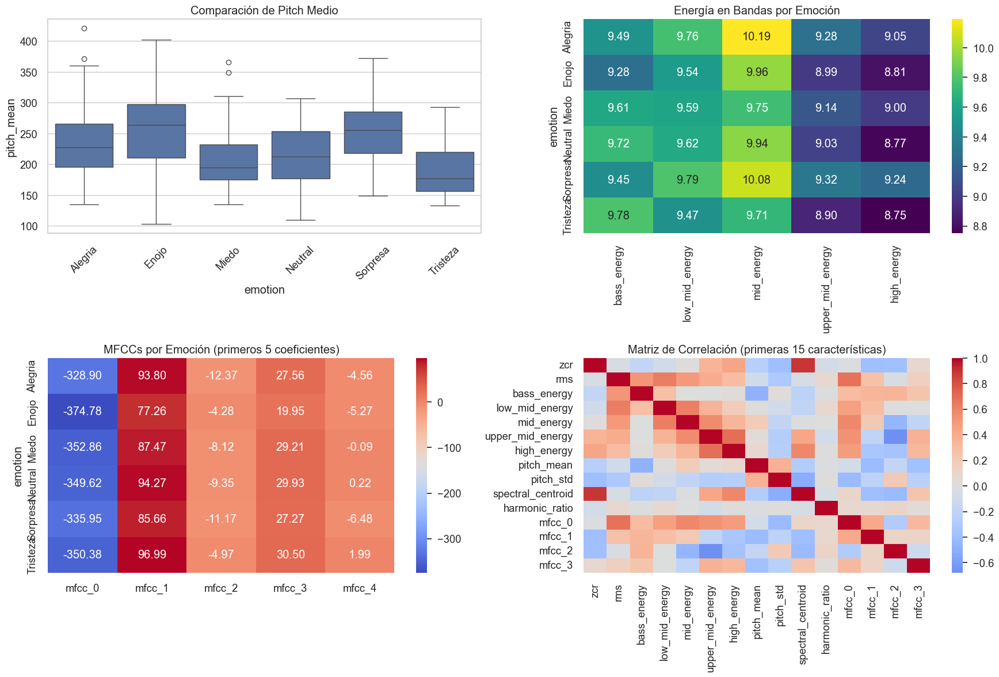

In [67]:
def plot_emotion_comparison():
    """Compara características clave entre todas las emociones"""
    plt.figure(figsize=(18, 12))
    
    # 1. Comparación de pitch
    plt.subplot(2, 2, 1)
    sns.boxplot(data=df, x='emotion', y='pitch_mean', order=EMOTIONS)
    plt.title('Comparación de Pitch Medio')
    plt.xticks(rotation=45)
    
    # 2. Comparación de energía en bandas
    plt.subplot(2, 2, 2)
    band_cols = [col for col in df.columns if '_energy' in col]
    band_means = df.groupby('emotion')[band_cols].mean()
    sns.heatmap(band_means, annot=True, cmap='viridis', fmt='.2f')
    plt.title('Energía en Bandas por Emoción')
    
    # 3. Comparación de MFCCs
    plt.subplot(2, 2, 3)
    mfcc_cols = [f'mfcc_{i}' for i in range(5)]
    mfcc_means = df.groupby('emotion')[mfcc_cols].mean()
    sns.heatmap(mfcc_means, annot=True, cmap='coolwarm', fmt='.2f')
    plt.title('MFCCs por Emoción (primeros 5 coeficientes)')
    
    # 4. Correlación entre características
    plt.subplot(2, 2, 4)
    corr_matrix = df.select_dtypes(include=np.number).corr()
    sns.heatmap(corr_matrix.iloc[:15, :15], cmap='coolwarm', center=0)
    plt.title('Matriz de Correlación (primeras 15 características)')
    
    plt.tight_layout()
    plt.show()

# %%
plot_emotion_comparison()

In [16]:
#!pip install librosa matplotlib numpy tk

## Visualizar un espectograma de 1 audio de Enojo

C:\Users\curso\anaconda3\Lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated and will be removed in a future release
  "class": algorithms.Blowfish,


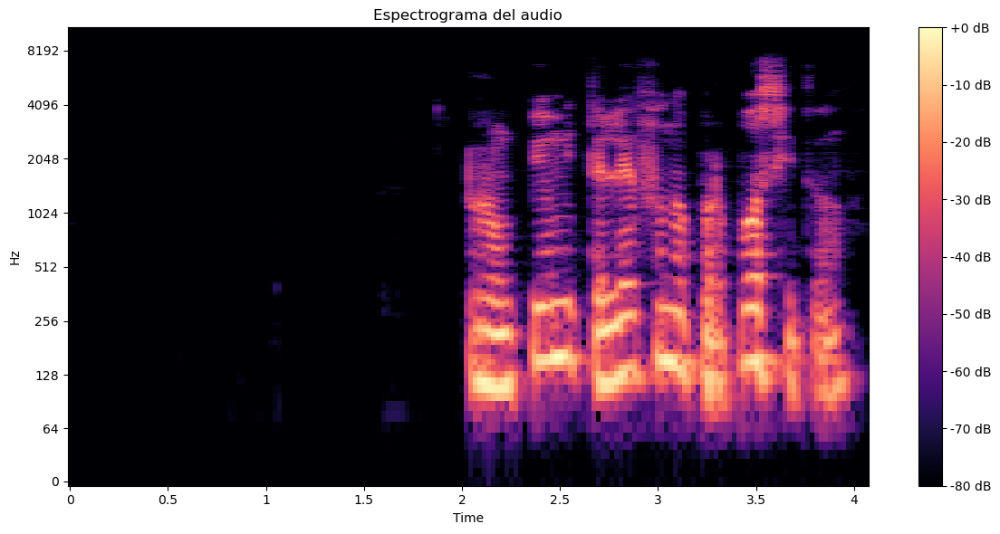

In [1]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np

def mostrar_espectrograma(ruta_audio):
    y, sr = librosa.load(ruta_audio)
    D = librosa.stft(y)
    S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)
    
    plt.figure(figsize=(12, 6))
    librosa.display.specshow(S_db, sr=sr, x_axis='time', y_axis='log')
    plt.colorbar(format='%+2.0f dB')
    plt.title('Espectrograma del audio')
    plt.tight_layout()
    plt.show()

# Ejemplo de uso
mostrar_espectrograma("Dataset/Enojo/Enojo_001.wav")

## Visualizar un espectograma de Alegría

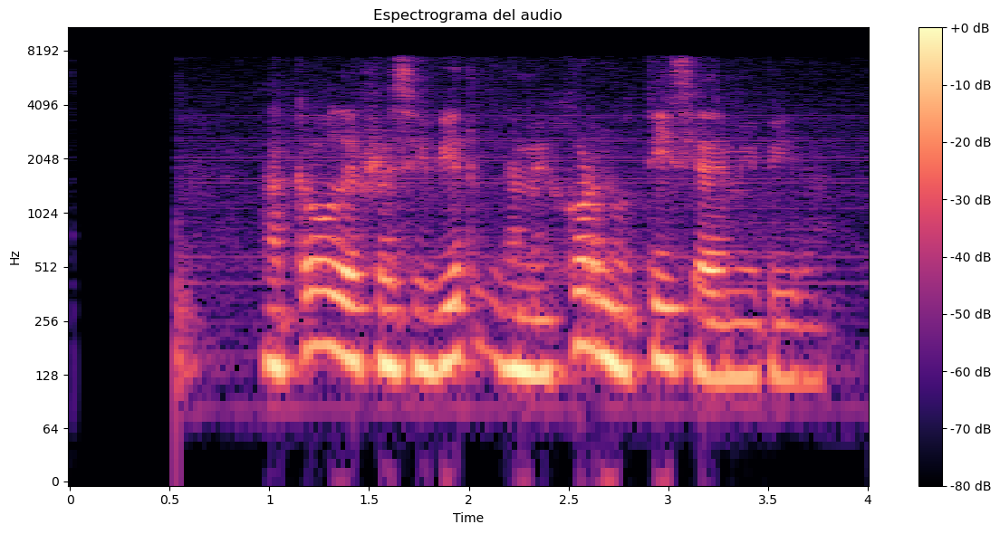

In [3]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np

def mostrar_espectrograma(ruta_audio):
    y, sr = librosa.load(ruta_audio)
    D = librosa.stft(y)
    S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)
    
    plt.figure(figsize=(12, 6))
    librosa.display.specshow(S_db, sr=sr, x_axis='time', y_axis='log')
    plt.colorbar(format='%+2.0f dB')
    plt.title('Espectrograma del audio')
    plt.tight_layout()
    plt.show()

# Ejemplo de uso
mostrar_espectrograma("Dataset_comprimido/Alegria/alegria (1) - Miguel Azaña Flores.wav")

In [ ]:
## Tristeza

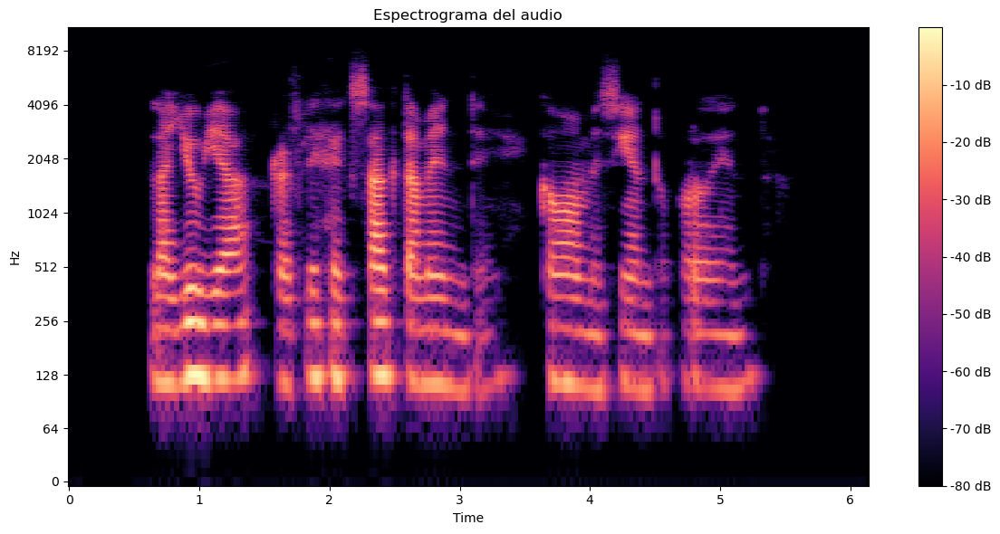

In [9]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np

def mostrar_espectrograma(ruta_audio):
    y, sr = librosa.load(ruta_audio)
    D = librosa.stft(y)
    S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)
    
    plt.figure(figsize=(12, 6))
    librosa.display.specshow(S_db, sr=sr, x_axis='time', y_axis='log')
    plt.colorbar(format='%+2.0f dB')
    plt.title('Espectrograma del audio')
    plt.tight_layout()
    plt.show()

# Ejemplo de uso
mostrar_espectrograma("Dataset/Tristeza/tristeza_029.wav")

## Para visualizar la compresión de un solo audio


🔊 Reproduciendo audio ORIGINAL:



🔇 Reproduciendo audio COMPRIMIDO:



📊 Comparación visual:


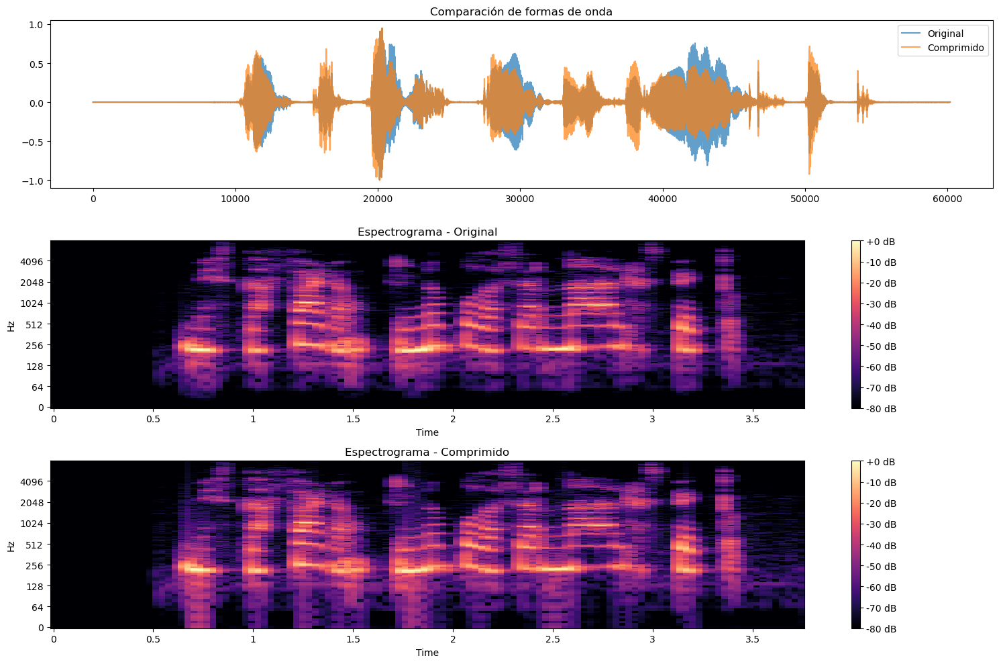


💾 Audio comprimido guardado en: Dataset/Enojo/Enojo_201_compressed.wav


In [5]:
import os
import librosa
import soundfile as sf
import numpy as np
import matplotlib.pyplot as plt
from tkinter import filedialog, Tk
from IPython.display import Audio, display

# ========== CONFIGURACIÓN ==========
SAMPLE_RATE = 16000
THRESHOLD_DB = -25    # Nivel donde empieza a comprimirse
RATIO = 3.0           # Ratio de compresión
MAKEUP_GAIN = 5.0     # Ganancia final para compensar

# ========== FUNCIONES ==========
def db_to_amp(db):
    return 10 ** (db / 20.0)

def compress_dynamic(y, sr, threshold_db, ratio, makeup_gain_db):
    frame_length = 2048
    hop_length = 512
    rms = librosa.feature.rms(y=y, frame_length=frame_length, hop_length=hop_length)[0]
    rms_db = librosa.amplitude_to_db(rms, ref=1.0)

    gain_db = np.zeros_like(rms_db)
    for i, db_val in enumerate(rms_db):
        if db_val > threshold_db:
            gain_db[i] = (threshold_db + (db_val - threshold_db) / ratio) - db_val
        else:
            gain_db[i] = 0.0

    gain_db += makeup_gain_db
    gain = db_to_amp(gain_db)

    y_compressed = np.zeros_like(y)
    for i, g in enumerate(gain):
        start = i * hop_length
        end = min(start + frame_length, len(y))
        y_compressed[start:end] += y[start:end] * g

    # Evitar clipping
    max_amp = np.max(np.abs(y_compressed))
    if max_amp > 1.0:
        y_compressed = y_compressed / max_amp

    return y_compressed

def plot_comparison(y_orig, y_comp, sr):
    plt.figure(figsize=(15, 10))
    
    # Onda de audio
    plt.subplot(3, 1, 1)
    plt.plot(y_orig, alpha=0.7, label='Original')
    plt.plot(y_comp, alpha=0.7, label='Comprimido')
    plt.title('Comparación de formas de onda')
    plt.legend()
    
    # Espectrograma original
    plt.subplot(3, 1, 2)
    D_orig = librosa.amplitude_to_db(np.abs(librosa.stft(y_orig)), ref=np.max)
    librosa.display.specshow(D_orig, sr=sr, x_axis='time', y_axis='log')
    plt.colorbar(format='%+2.0f dB')
    plt.title('Espectrograma - Original')
    
    # Espectrograma comprimido
    plt.subplot(3, 1, 3)
    D_comp = librosa.amplitude_to_db(np.abs(librosa.stft(y_comp)), ref=np.max)
    librosa.display.specshow(D_comp, sr=sr, x_axis='time', y_axis='log')
    plt.colorbar(format='%+2.0f dB')
    plt.title('Espectrograma - Comprimido')
    
    plt.tight_layout()
    plt.show()

def process_single_file():
    # Configurar interfaz para seleccionar archivo
    root = Tk()
    root.withdraw()
    file_path = "Dataset/Enojo/Enojo_201.wav"
    
    if not file_path:
        print("No se seleccionó ningún archivo.")
        return
    
    # Cargar audio original
    y_orig, sr = librosa.load(file_path, sr=SAMPLE_RATE)
    
    # Mostrar audio original
    print("\n🔊 Reproduciendo audio ORIGINAL:")
    display(Audio(data=y_orig, rate=sr))
    
    # Aplicar compresión
    y_comp = compress_dynamic(y_orig, sr, THRESHOLD_DB, RATIO, MAKEUP_GAIN)
    
    # Mostrar audio comprimido
    print("\n🔇 Reproduciendo audio COMPRIMIDO:")
    display(Audio(data=y_comp, rate=sr))
    
    # Mostrar comparación visual
    print("\n📊 Comparación visual:")
    plot_comparison(y_orig, y_comp, sr)
    
    # Guardar archivo comprimido (opcional)
    output_path = os.path.splitext(file_path)[0] + "_compressed.wav"
    sf.write(output_path, y_comp, sr)
    print(f"\n💾 Audio comprimido guardado en: {output_path}")

# ========== EJECUCIÓN ==========
if __name__ == "__main__":
    process_single_file()